# Complaint Response Generation using BART finetuning

This notebook demonstrates the end-to-end process of generating automated responses for consumer complaint tickets using Natural Language Processing (NLP). The key steps include:

1. **Installing and importing dependencies**
2. **Preprocessing complaint texts**
3. **Embedding complaint data for retrieval**
4. **Training a text generation model (BART)**
5. **Evaluating the generated responses**

The objective is to generate helpful responses to consumer issues that can later be reviewed or fine-tuned by human agents.

#### Libraries installed

In [142]:
#pip install gensim
#pip install nltk
#pip install gensim faiss-cpu
#pip install pyspellchecker
#pip install bs4
#pip install contractions
#pip install textblob
#pip install --upgrade torch torchvision torchaudio transformers
#pip install rouge-score
#pip uninstall pyarrow -y
#pip install --no-cache-dir pyarrow
#pip install datasets --user
#export TRANSFORMERS_NO_FLEX_ATTENTION=1
#pip install transformers[torch]
#pip install tensorboardX
#pip install evaluate


#### Import liberaries

In [4]:
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from spellchecker import SpellChecker
import contractions
from textblob import TextBlob
from bs4 import BeautifulSoup
from gensim.models import Word2Vec
from transformers import AutoTokenizer
from transformers import Trainer, TrainingArguments, DataCollatorForLanguageModeling
from transformers import pipeline, Seq2SeqTrainer, Seq2SeqTrainingArguments, AutoModelForSeq2SeqLM
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator
from sklearn.model_selection import StratifiedKFold
from nltk.translate.bleu_score import sentence_bleu
from datasets import Dataset
from evaluate import load
import random
import textwrap

import pandas as pd
import numpy as np
import re
import string
import matplotlib.pyplot as plt
import seaborn as sns

nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt_tab')


[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     C:\Users\HP\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [3]:
import torch
import transformers
import tensorflow

print("Torch version:", torch.__version__)
print("Transformers version:", transformers.__version__)
print("Tensorflow version:", tensorflow.__version__)

Torch version: 2.2.0+cpu
Transformers version: 4.30.0
Tensorflow version: 2.13.0


#### Load the data

In [4]:
data = pd.read_csv('Bitext_Sample_Customer_Support_Training_Dataset_27K_responses-v11 (1).csv')

data.head()

,flags,instruction,category,intent,response
0,B,question about cancelling order {{Order Number}},ORDER,cancel_order,I've understood you have a question regarding ...
1,BQZ,i have a question about cancelling oorder {{Or...,ORDER,cancel_order,I've been informed that you have a question ab...
2,BLQZ,i need help cancelling puchase {{Order Number}},ORDER,cancel_order,I can sense that you're seeking assistance wit...
3,BL,I need to cancel purchase {{Order Number}},ORDER,cancel_order,I understood that you need assistance with can...
4,BCELN,"I cannot afford this order, cancel purchase {{...",ORDER,cancel_order,I'm sensitive to the fact that you're facing f...


#### Some EDA

In [4]:
df.shape

(26872, 5)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26872 entries, 0 to 26871
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   flags        26872 non-null  object
 1   instruction  26872 non-null  object
 2   category     26872 non-null  object
 3   intent       26872 non-null  object
 4   response     26872 non-null  object
dtypes: object(5)
memory usage: 1.0+ MB


In [6]:
df.describe()

,flags,instruction,category,intent,response
count,26872,26872,26872,26872,26872
unique,394,24635,11,27,26870
top,BL,shipments to {{Delivery City}},ACCOUNT,edit_account,"Firstly, I truly understand how pivotal the {{..."
freq,5212,8,5986,1000,2


In [8]:
df["flags"].value_counts()

BL        5212
BLQ       2467
BIL       2138
BLM       1297
BILQ      1057
          ... 
BCEIQ        1
BIPQS        1
BW           1
BCNPQZ       1
BELMNW       1
Name: flags, Length: 394, dtype: int64

In [9]:
df["category"].value_counts()

ACCOUNT         5986
ORDER           3988
REFUND          2992
INVOICE         1999
CONTACT         1999
PAYMENT         1998
FEEDBACK        1997
DELIVERY        1994
SHIPPING        1970
SUBSCRIPTION     999
CANCEL           950
Name: category, dtype: int64

In [11]:
df["intent"].value_counts()

edit_account                1000
switch_account              1000
check_invoice               1000
complaint                   1000
contact_customer_service    1000
delivery_period              999
registration_problems        999
check_payment_methods        999
contact_human_agent          999
payment_issue                999
newsletter_subscription      999
get_invoice                  999
place_order                  998
cancel_order                 998
track_refund                 998
change_order                 997
get_refund                   997
create_account               997
check_refund_policy          997
review                       997
set_up_shipping_address      997
delivery_options             995
delete_account               995
recover_password             995
track_order                  995
change_shipping_address      973
check_cancellation_fee       950
Name: intent, dtype: int64

In [3]:
df["cate_intent"] = df["category"] + "_" + df["intent"]
df["cate_intent"].value_counts()

ACCOUNT_edit_account                    1000
ACCOUNT_switch_account                  1000
INVOICE_check_invoice                   1000
FEEDBACK_complaint                      1000
CONTACT_contact_customer_service        1000
DELIVERY_delivery_period                 999
ACCOUNT_registration_problems            999
PAYMENT_check_payment_methods            999
CONTACT_contact_human_agent              999
PAYMENT_payment_issue                    999
SUBSCRIPTION_newsletter_subscription     999
INVOICE_get_invoice                      999
ORDER_place_order                        998
ORDER_cancel_order                       998
REFUND_track_refund                      998
ORDER_change_order                       997
REFUND_get_refund                        997
ACCOUNT_create_account                   997
REFUND_check_refund_policy               997
FEEDBACK_review                          997
SHIPPING_set_up_shipping_address         997
DELIVERY_delivery_options                995
ACCOUNT_de

In [7]:
df.isnull().sum()

flags          0
instruction    0
category       0
intent         0
response       0
dtype: int64

In [14]:
df['instruction']

0         question about cancelling order {{Order Number}}
1        i have a question about cancelling oorder {{Or...
2          i need help cancelling puchase {{Order Number}}
3               I need to cancel purchase {{Order Number}}
4        I cannot afford this order, cancel purchase {{...
                               ...                        
26867    I am waiting for a rebate of {{Refund Amount}}...
26868    how to see if there is anything wrong with my ...
26869    I'm waiting for a reimbjrsement of {{Currency ...
26870    I don't know what to do to see my reimbursemen...
26871    I need to know if there is anything new on the...
Name: instruction, Length: 26872, dtype: object

In [15]:
df['response']

0        I've understood you have a question regarding ...
1        I've been informed that you have a question ab...
2        I can sense that you're seeking assistance wit...
3        I understood that you need assistance with can...
4        I'm sensitive to the fact that you're facing f...
                               ...                        
26867    Thank you for sharing your situation regarding...
26868    Ensuring the accuracy of your restitution is o...
26869    Firstly, I genuinely understand the importance...
26870    I've understood you're unsure about how to che...
26871    It's completely understandable that you want t...
Name: response, Length: 26872, dtype: object

In [16]:
print(df['instruction'][1])
print("-------------------")
print(df['instruction'][100])
print("---------------------")
print(df['instruction'][1000])


i have a question about cancelling oorder {{Order Number}}
-------------------
where can I cancel order {{Order Number}}?
---------------------
want help adding an item to order {{Order Number}}


#### I noticed that there is a word "product_purchased" present in most of the column is it normal

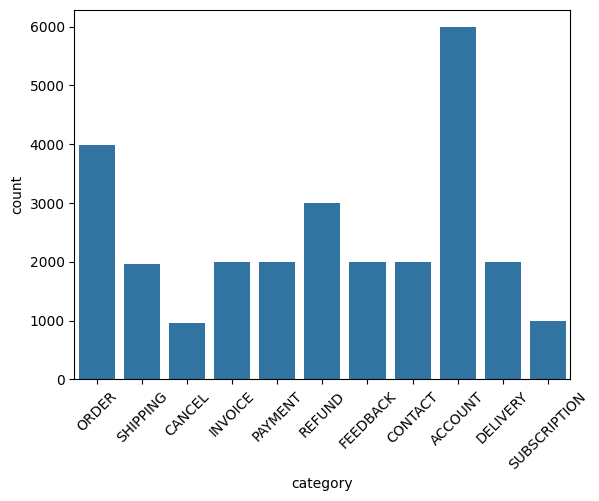

In [17]:
sns.countplot(x ='category', data = df)
plt.xticks(rotation=45)
plt.show()

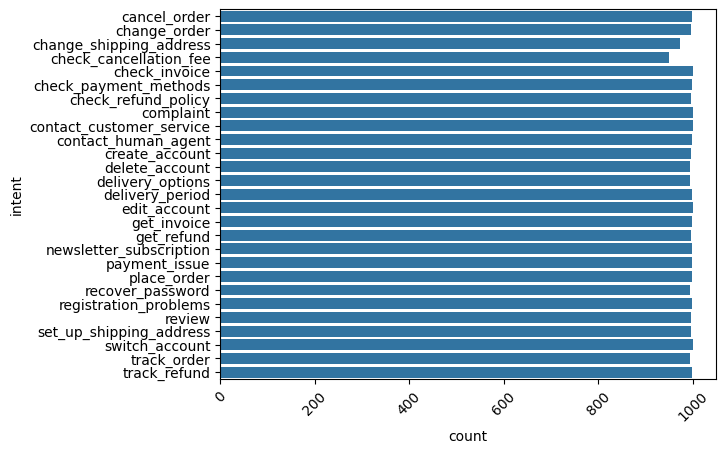

In [19]:
sns.countplot( y='intent', data = df)
plt.xticks(rotation=45)
plt.show()

### We will focus on ticket description column

In [9]:
# check if empty tickets are present

ticket_len = df["instruction"].apply(lambda x: len(x.split()))
print(min(ticket_len))
print(max(ticket_len))

1
16


In [11]:
ticket_len = df["response"].apply(lambda x: len(x.split()))
print(min(ticket_len))
print(max(ticket_len))

9
402


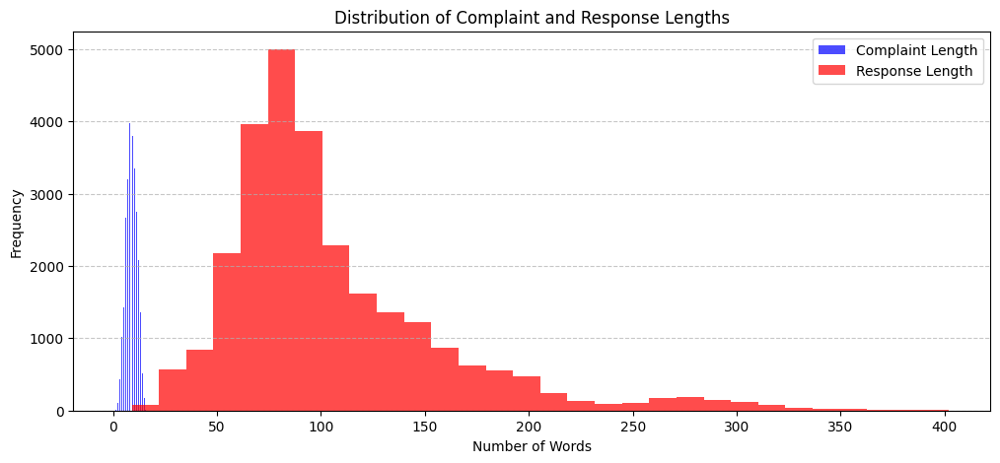

In [13]:
# Compute lengths
df["complaint_length"] = df["instruction"].apply(lambda x: len(x.split()))
df["response_length"] = df["response"].apply(lambda x: len(x.split()))

# Plot histograms
plt.figure(figsize=(12, 5))

plt.hist(df["complaint_length"], bins=30, alpha=0.7, label="Complaint Length", color="blue")
plt.hist(df["response_length"], bins=30, alpha=0.7, label="Response Length", color="red")

plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.title("Distribution of Complaint and Response Lengths")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()


#### Preprocessing complaint description and respone

In [38]:
# Contraction mapping
CONTRACTION_MAP = {
    "i've": "i have",
    "i'm": "i am",
    "don't": "do not",
    "can't": "cannot",
    "won't": "will not",
    "it's": "it is",
    "you're": "you are",
    "they're": "they are",
    "we're": "we are",
    "that's": "that is",
    "what's": "what is",
    "who's": "who is",
    "where's": "where is",
    "when's": "when is",
    "why's": "why is",
    "how's": "how is",
    "let's": "let us",
    "he's": "he is",
    "she's": "she is",
    "there's": "there is",
    "here's": "here is",
    "isn't": "is not",
    "aren't": "are not",
    "wasn't": "was not",
    "weren't": "were not",
    "hasn't": "has not",
    "haven't": "have not",
    "hadn't": "had not",
    "doesn't": "does not",
    "didn't": "did not",
    "wouldn't": "would not",
    "shouldn't": "should not",
    "couldn't": "could not",
    "mustn't": "must not",
    "i'll": "i will",
    "you'll": "you will",
    "he'll": "he will",
    "she'll": "she will",
    "we'll": "we will",
    "they'll": "they will",
    "it'll": "it will",
    "that'll": "that will",
    "there'll": "there will",
    "this'll": "this will",
    "what'll": "what will",
    "who'll": "who will",
    "where'll": "where will",
    "when'll": "when will",
    "why'll": "why will",
    "how'll": "how will",
}

def expand_contractions(text, contraction_mapping=CONTRACTION_MAP):
    """Expands contractions in the text."""
    for contraction, expansion in contraction_mapping.items():
        text = text.replace(contraction, expansion)
    return text

def preprocess_text(text, text_column):
    """Cleans and preprocesses text while expanding contractions and preserving placeholders like {number}."""
    if not isinstance(text, str):
        return ""  # Handle cases where text is NaN or not a string
    
    print(list(text_column.values).index(text))

    # Lowercasing
    text = text.lower()

    # Replace account numbers (assuming they are numeric sequences with 6+ digits)
    text = re.sub(r'\b\d{6,}\b', '{number}', text)

    # Expand contractions
    text = expand_contractions(text)

    # Remove special characters except `{}` placeholders
    text = re.sub(r"[^\w\s{}]", "", text)

    # Remove extra spaces
    text = re.sub(r"\s+", " ", text).strip()
    print(text)
    print("==========")
    return text

In [39]:
# Apply preprocessing to both columns
data["ticket_processed"] = data["instruction"].apply(lambda x: preprocess_text(text=x, text_column=data["instruction"]))


0
question about cancelling order {{order number}}
1
i have a question about cancelling oorder {{order number}}
2
i need help cancelling puchase {{order number}}
3
i need to cancel purchase {{order number}}
4
i cannot afford this order cancel purchase {{order number}}
5
can you help me cancel order {{order number}}
6
i can no longer afford order {{order number}} cancel it
7
i am trying to cancel purchase {{order number}}
8
i have got to cancel purchase {{order number}}
9
i need help canceling purchase {{order number}}
10
i dont know what to do to cancel order {{order number}}
11
i have a problem with cancelling purchase {{order number}}
12
problem with canceling purchase {{order number}}
13
can you help me canceling order {{order number}}
14
help me canceling purchase {{order number}}
15
can you help me cancel purchase {{order number}}
16
what do i have to do to cancel purchase {{order number}}
17
i bought the same item twice cancel order {{order number}}
18
need help with canceling or

319
question about cancelling purchase {{order number}}
525
is it possible to cancel order {{order number}}
526
i cant afford order {{order number}}
527
i can no longer afford purchase {{order number}} cancel it
152
i do not want purchase {{order number}}
160
i have problems with canceling purchase {{order number}}
290
i dont want order {{order number}}
531
i want assistance canceling purchase {{order number}}
176
i dont know how to cancel purchase {{order number}}
161
is it possible to cancel order {{order number}}
106
i do not know how to cancel order {{order number}}
301
assistance to cancel purchase {{order number}}
501
i need help with canceling order {{order number}}
457
i have a question about canceling purchase {{order number}}
538
i ordered some products how to cancel purchase {{order number}}
539
i cannot afford order {{order number}} how can i cancel it
369
i do not want purchase {{order number}}
541
i can no longer pay for order {{order number}}
274
i do not know how to can

1131
i cant swap an item of order {{order number}}
1132
can i remove a product from purchase {{order number}}
1133
i need assistance correcting purchase {{order number}}
1134
i want assistance editing purchase {{order number}}
1135
i have to change purchase {{order number}} i need help
1136
can i change several articles of order {{order number}}
1137
wanna edit order {{order number}}
1138
need help removing several products from order {{order number}}
1139
can i delete several products from order {{order number}}
1140
i cannot swap several articles of order {{order number}}
1141
i have to correct order {{order number}} could you help me
1142
assistance to remove an item from order {{order number}}
1143
editing purchase {{order number}}
1144
how do i modify purchase {{order number}}
1145
i need assistanc with adding an item to order {{order number}}
1146
i have got to delete an article from purchase {{order number}}
1147
remove something from order {{order number}}
1148
i would like to 

1799
help me switching an article of purchase {{order number}}
1800
help with adding several items to purchase {{order number}}
1460
update order {{order number}}
1802
how can i add an item to purchase {{order number}}
1803
help adding an article to purchase {{order number}}
1804
i try to delete an product from purchase {{order number}}
1805
how do i change an item of order {{order number}}
1806
i canot correct the order i made
1807
how do i update order {{order number}}
1808
modify order00004587345
1809
i forgot to include an item in purchase {{order number}}
1810
i want to pudate purchase {{order number}} can you help me
1370
update purchase {{order number}}
1812
how do i edit purchase {{order number}}
1813
i want help removing a product from order {{order number}}
1814
i cannot change some products of pirchase {{order number}}
1815
i want information about correcting order {{order number}}
1816
herlp to swap an article of order {{order number}}
1082
change order {{order number}}
181

2115
want assistance updating the address
2116
can you tell me more about correcting the shipping address
2117
i do not know how i can edit the delivery address
2118
have problems with a shipping address modification
2119
i need supports trying to update my shipping address
2120
there is a trouble modifying the shipping address
2121
can you help me to correct the delivery address
2122
i need help trying to upadte the shipping address
2123
i have entered a wrong shipping address by mistae
2124
i try to correct the shipping address
2125
the address changed i need assistace editing it
2126
support changing my shipping address
2127
issues updating shipping address
2128
i have a truble editing my shipping address
2129
i need information about correcting my shipping address
2130
i have a trouble trying to change my delivery address
2131
i would like to know about a delivery address modification
2132
problems changing delivery address
2133
where to modify my delivery address
2134
i cannot cor

2566
supports editing the delivery address
2567
where can i get information about changing the address
2568
wanna change my fucking address
2569
i need support modifying the shipping address
2570
i do not know how i can correct my delivery address
2571
i need support updating the delivery address
2572
tell me more abou editing my address
2573
how do i correct my delivery address
2574
need assistance modifying the shipping address
2575
is it possible to correct the delivery address
2576
there is an issue trying to update the shipping address
2577
i have problems trying to edit the delivery address
2578
i cannot edit the shipping address
2579
need support tryinmg to change the address
2580
i need assistance to change the delivery address
2581
i need assistance correcting my shipping address
2582
help with a fucking address change
2583
there is a problem trying to edit the address
2584
need help to change my delivery address
2585
need to change my shipping address
2586
want assistance try

3034
i cannot find the early termination penalties help me
3035
i do not know how i can see the cancellation fees
3036
need assistance seeing the termination charge
3037
i have to see the early termination penalty
3038
wanna check the termination penalties
3039
see cancellation charge
3040
i do not know what to do to see the withdrawal fee
3041
assistance to check the early exit fees
3042
help me to check the withdrawal charges
3043
i want help to check the termination penalties
3044
what is the early exit penalty
3045
i do not know how to see the withdrawal charges
3046
assistance to check the early exit penalty
3047
i am trying to see the early exit penalties
3048
i want to check the early exit fees can you help me
3049
is it possible to see the early termination penalty
3050
i want assistance seeing the bloody cancellation fee
3051
how to see the termination penalty
3052
want help to check the early termination fees
3053
i dont know how i can check the early termination charges
3054

3355
i do not know how i can check theearly exit penalty
3356
how could i check the goddamn termination fee
3357
i want assistance checking the early termination fee
3358
i cannot find the early exit charge
3359
cancellation penalty
3360
can uhelp me to see te early exit charges
3361
i cannot find the early termination fee i need help
3362
where to check the withdrawal penalty
3363
i cannot find the damn cancellation penalty
3364
i want assistance seeing the withdrawal penalty
3365
could you help me see the early termination charges
3366
want assistance to see the terminatoin charges
3367
i need assistance to check the early terminaion charge
3368
can uhelp me seeing the withdrawal charge
3369
seeing termination charge
3370
where do i check the withdrawal charges
3371
i need help seeing the termination charges
3372
what do i have to do to see the cancellation charges
3373
where do i check the termination fees
3374
where do i check the early termination charges
3375
i do not kow how to 

3717
i want assistance seeing the early termination fee
3718
were can i check the early termination penalty
3719
withdrawal fee
3720
i want to check the termination penalty help me
3721
can uhelp me seeing the cancellation charge
3722
i want to see the early exit penalty
3723
i do not know what i have to do to check te cancellation fee
3724
seeing early exit penalty
3725
can uhelp me ot check the goddamn early exit penalties
3726
i want to see the withdrawal fees how can i do it
3727
assistance checking the termination fees
3728
i need to see the goddamn cancellation fee
3729
wanna check the withdrawal penalty help me
3730
is it possbile to see the withdrawal fees
3731
i do not know how i can check the cancellatio charges
3732
i want assistance seeing the termination fees
3733
i want assistsnce seeing the withdrawal penalty
3734
i want help seeing the withdrawal penalties
3735
i want help to check the early termination charge
3736
seeing withdrawal charges
3737
i want assistance to che

4182
i need to locate my bill from {{person name}} will you help me
4183
i need help to look for the bills from {{person name}}
4184
i do not know what i need to do to check the invoice 37777
4185
will you show me my damn bills from {{person name}}
4186
is it possible to locate my bill from {{person name}}
4187
how to check bill 00108
4188
i want to give a quick look at my bill 00108 help me
4189
where could i take a quick look at invokce 37777
4190
where to check the invoice from three last purchases
4191
check invoice 12588
4192
check bill 85632
4193
i do not know what i have to do to locate the invoice 00108
4194
how can i take a quick look at my invoice from {{person name}}
4195
how do i find my invoice 00108
4196
i want help taking a quick look at the invoice 12588
4197
check invoices
4198
i want help to give a quick look at the invoice 00108
4199
i need assistance to locate my invoices from {{person name}}
4200
checking invoices from last month
4201
seeing bill from {{person name

4563
i do not know how to look for the invoice 85632
4564
i do not know what to do to locate invoice 00108
4565
wanna locate the ivoice from {{person name}} can i get some help
4566
how to check the bill 00108
4567
can i give a quick look at bill 37777
4568
i need help giving a quick look at the bill 00108
4569
wanna see my bill from {{person name}}
4570
seeingbill from {{person name}}
4571
wanna check my goddamn invoices from {{person name}}
4572
i have to locate my bill 00108 help me
3959
find the bill from {{person name}}
4574
i odnt know how i can look for my invoice 12588
4575
want help chceking invoice 85632
4576
ser the bill 85632
4577
i have to take a quick look at my invoice from {{person name}}
4578
want assistance to give a quick look at the invoice 12588
4579
how to see bill 37777
4580
how do i check the invoice 37777
4581
i want to locate my invoices from {{person name}}
4582
i have to find my bills from {{person name}}
4583
i have got to check my bills from {{person name}

5040
i have to check the accepted payment options
5041
where can i check what payment methoda ya accept
5042
how to see your allowed payment methods
5043
i do not know how to list the payment options
5044
i have got to check the available payment options
5045
how do i check what payment payment modalities are accepted
5046
list the allowed payment modaliites
5047
i want help listing the accepted payment options
5048
helpchecking the allowed payment options
5049
is it possible to check the available payment modalities
5050
i am trying to list your acceoted payment options
5051
help me to see your accepted payment modalities
5052
i want help checking ur available payment modalities
5053
i have to check your payment modalities
5054
i need help to list your payment methods
5055
could i list ur accepted payment options
5056
help to list the available payment modalities
5057
i want assistance to see the accepted paynent options
5058
check the accepted payment modalities
5059
i need assistanc

5401
how to list the allowed payment modalities
5402
where to check the accepted payment options
5403
tell available payment modalities
5404
i want to see the accepted payment methods
5405
i want to see what payment options are availabl
5406
wanna check the available payment options help me
5407
how do i see ur accepted paument methods
5408
i want help listing u payment methods
5409
assistance checking your accepted payment modalities
5410
i have to see your allowed payment methods
5411
help to see your accepted paymentt methods
5412
i want help checking your allowed payment methods
5413
i need help checking what payment methods are accepted
5414
i want to check your payment modalities
5415
i need assistance checking what payment options you accept
5416
check accepted payment methoxs
5417
i want help to see ur available payment methods
5418
how to check what payment options are accepted
5419
i have got to see the allowed payment modalities help me
5420
how can i see what payment paymen

5772
can you show me what goddamn payment options you accept
5773
help me see the allowed payment options
5774
assistance to list your fucking accepted payment modalities
5775
what are your allowed payment modalities
5776
i would like to list the accepted payment options help me
5777
checking allowed payment methods
5778
will you tell me the available payment modalities
5779
can you help me listing your accepted payment modalities
5780
help to see ur payment options
5781
what do i have to do to see your payment methods
5782
help seeing the accepted payment options
5783
need assistaance to see the accepted payment methods
5784
help me list your accepted payment methods
5785
i do not knowhow i can list the payment options
5786
help me checking the accepted payment modalities
5787
i need assistance checking the payment methods
5788
i need help to see ur available payment methods
5789
i want assistance seeing your accepted payment methods
5790
assistance checking what payment methods are a

6058
i want help to check in which cases can i ask for refunds
6059
need help to check in which cases can i ask to be refunded
6060
i need assistance seeing how long refunds take
6061
help me to see in which cases can i request a reimbursement
6062
i want to see your refund policy
6063
can i see in what cases can i ask for reimbursements
6064
how do i check your money back policy
6065
i want help to check how long reimbursements take
6066
see in what cases can i request refunds
6067
help me seeing in what cases can i request reimbursements
6068
wanna see how long refunds take could ya help me
6069
help me see under what circumstances can i request a refund
6070
i need to check how long rimbursements take
6071
want assistance to see how long refunds usually take
6072
show me in which situations can i ask to be refunded
6073
would it be possible to see how long reimbursements take
6074
show me in which cases can i request to be refunded
6075
i have to see in what cases can i ask for reim

6408
can i see under which circjmstances can i ask for refunds
6409
i want to see in which cases can i ask for reimbursements
6410
help me see in which cases can i ask for an refund
6411
were could i check your money back policy
6412
i dont know how to see ur goddamn money back guarantee
6413
i do not know how i can check your money back guarantee
6414
help seeing in what cases can i ask for reimbursements
6415
i want help checking in what cases can i ask for a refund
6416
show ur money back policcy
6417
help me check in what cases can i ask to be refunded
6418
i want to check in which situations can i request refunds
6419
want help to check in what cases can i request refunds
6420
can i check in which cases can i ask for my money back
6421
i do not know how i can see your refund policy
6422
help me see in what situations can i request my money back
6423
i try to see how long reimbursements take
6424
i have got to see how long refunds take i need help
6425
help to check in which cases 

6858
check in which cases can i request refunds
6859
see how long refunds take
6860
am i entitled to a reimbursement
6861
i have got to see in which situations can i request a refund
6862
what do i need ti do to check ur refund policy
6863
show me in which cases can i ask for refunds
6864
i need to check in what cases can i request refunds help me
6865
check in which situations can i ask for refunds
6866
need help seeing in which cases can i request a refund
6867
help checking in which cases can i request to be refunded
6868
check under what circumstaces can i request a goddamn refund
6869
help me to see how long reimbursements take
6870
could i see in which cases can i ask to be refunded
6871
i try to see in what cases can i ask to be reimbursed
6872
i want to see your money back guarantee how could i do it
6873
i try to see in what cases can i ask for a refund
6874
i have to see how long refunds take how do i do it
6875
check under which circumstances can i ask for refunds
6876
help 

7283
making customer claim
7284
how to file a customer reclamation against ur organization
7285
how to lodge a complaint against your organization
7286
i have got to lodge a complaint can i get some help
7287
i need assistance filing a reclamation
7288
where do i file a consumer reclamation against ur business
7289
i want help to file a customer complaint
7290
i need help making a complaint
7291
i am calling to lodge a claim against ur organization
7292
can ya hrlp me make a claim against ur organization
7293
want assistance to make a reclamation against ur business
7294
want help making an customer claim against your business
7295
can you help me lodging a reclamation
7296
lodging claim
7297
i try to make a consumer reclamation
7298
where to file a customer reclamation against your company
7299
i want to file a reclamation
7300
help m make a claim against ur company
7301
i want help to file a consumer claim against ur organization
7302
i aint happy with your service i want help filing

7714
want assistance to file a complaint against ur company
7715
lodging customer claim against ur company
7716
is it possible to file a customer complaint
7717
i do not know what i have to do to make a customer lcaim
7718
how do i file a consumer claim against ur business
7719
file reclamation
7720
need to file a complaint against ur company
7721
can uhelp me lodge a customer complaint
7722
i do not know how i can file a claim against your business
7723
where could i make a complaint against ur organization
7724
where do i file an customer claim against your organization
7725
want assistance to lodge a complaint against your business
7726
i try to file a consumer claim against your business
7727
where to make a customer claim
7728
i have got to make a customer reclamation how to do it
7729
help me file a consumer complaint against ur company
7730
can i make a customer reclamation against ur company
7731
filing consumer reclamation against your business
7732
help me to file a consumer 

8162
ya have a free of charge number to talk to customer service
8163
need help calling damn customer assistanec
8164
i want to check at what time customer support available is
8165
help me see at what time i can call customer support
8166
talk with customer support
8167
how do i see at what time i can recah customer service
8168
do ya have an email address to contact customer support
8169
ya have a free of charge number to reach customer service
8170
i have to check what hours i can reach customer assistance
8171
i dont know how i could talk to customer support
8172
i need to talk with customer service
8173
need to see at what time customer assistance avaialble is
8174
i have got to see what hours i can reach customer service
8175
i dont know how to contact customer support
8176
i want help seeing what hours i can call customer support
8177
help to check what hours i can reach customer service
8178
need help to see at what time customer service availabl is
8179
help me seeing at what 

8611
where do i see at what time i can reach customer support
8612
i want to get in touch with customer service
8613
i try to see what hours i can reach customer support
8614
need to call customer service
8615
check at what time i can call customer support
8616
can i check what hours i can contact customer service
8617
tell me what hours i can get in touch wit customer service
8618
can i check what hours i can reach customer support
8619
can ya help me speak to customer service
8620
how can i contact cusomer support
8621
assistance to talk with customer support
8622
can i check at what time i can call custoer assistance
8623
i am trying to see what hours i can call customer service
8624
i have to talk to customer service how do i do it
8625
want help talking with customer support
8626
i need help talking to customer service
8627
i have got to call customer service i need help
8628
help me to see at what time i can contact customer support
8629
help to get in touch with customer support

9098
can uhelp me to talk to an assistat
9099
i do not know what i have to do to talk to someone
9100
is it possdible to talk with someone
9101
what do i have to do to chat with an operator
9102
assistance to speak with a human agent
9103
how to contact a human agent
9104
i do not want to talk to a bot direct to me a human agent
9105
i cannot understand you i need to speak with a live agent
9106
i do not want to chat with a bot transfer to me someone
9107
how can i talk with a person
9108
contacting live agent
9109
i need someone
9110
i need help to chat with a live avent
9111
i need help to talk with a live agent
9112
i need help to talk with a human agent
9113
i do not know how i can speak to someone
9114
how do i contact an operator
9115
i do not know what i have to do to talk to an assistant
9116
can you help me to talk with an assistant
9117
want help to contact an agent
9118
i want assistance seaking with someone
9119
i cannot pseak to an operator
9120
i do not know how i can cha

9550
what do i have to do to cntact an assistant
9551
i have tl talk to a live agent
9552
i dont know how to talk to someone
9553
i nded assistance to talk to a live agent
9554
i need to chat with a live agent
9555
i cannot understand you assistance speaking to an assistant
9556
i cannot chat with a goddamn operator
9557
can i talk with someone
9558
want assistance to talk with an operator
9559
what do i have to do to talk to somebody
9560
is it possible toi chat with somebody
9561
uarent being helpful how to chat with a agent
9562
i want assistance to talk with an agent
9563
i need assistance talking with a perrson
9564
i need help to speak with a live agent
9565
help me talking with a live agent
9566
i need assistance talking to a live agent
9567
can i speak with a person
9568
direct to me a person
9569
i do not understand you i awnt to talk with someone
9570
i do not know how to speak with an assistan
9571
i try to talk to a live agent
9572
i do not understand you help talking to a 

9971
create gold account
9972
i do not have a {{account type}} account want help signing up
9973
i have not signed up yet help me to create a pro account
9974
where to create a pro account
9975
i do not know how to create a {{account category}} account for my dad
9976
i have a question about creating a {{account type}} account
9977
could i open a standard account
9978
new bloody {{account category}} account for father
9979
open a pro account for my dad
9980
i have problems with opening a premium account
9981
open freemium cacount for wife
9982
i have problems with opening a freemium account
9983
problem with creating a gold account
9984
new bloody {{account type}} account
9985
i try to open a standard account
9986
help me to open a {{account type}} account
9987
have problems with creating my standard account
9988
i aint registered yet could i create a bloody gold acocunt
9989
create new {{account category}} account for daughter
9990
i would like to create a freemium account for my dad


10391
help me opening a standard account
10392
i cannot create a {{account category}} account
10393
i do not know how to create a platinum account for my dad
10394
i aint registered how to open a {{account category}} account
10395
how to create a platinum account for my fiance
10396
i want help to create a gold account for my fiance
10397
i aint registered yet i need to create a damn pro account
10398
create pro account
10399
new {{account category}} account
10400
i am not registered help me open a gold account with you
10401
need assistance to create a premium account
10402
id like informatoin about opening platinum accounts
10348
create another {{account category}} account for mum
10103
i want help to open a {{account type}} account
10018
open {{account category}} account
10406
i do not have a premium account i want to open one
10407
help with creating my standard account
9917
opdn {{account category}} account
9989
create new {{account category}} account for daughter
10410
create acc

10171
what do i have to do to open a {{account type}} account
10756
i cannot create a freemium accounmt for my daughter
10757
i have to open a platinum account
10758
where do i create a new fucking standard account
10759
i do not know how to create a {{account type}} account
10760
open standard account for wife
10761
i need informqtion about creating platinum accounts
10762
i have got to create a {{account category}} account
10763
i aint registered assistance opening an account with you
10764
i am looking for information about opening a {{account type}} account
10765
how do i create a {{account type}} account for my daughter
10766
i do not know what to do to create a {{account category}} account
10767
wanna open a {{account type}} acfcount
10768
is it possible to create a standard account
10769
where do i open a standard account
10770
new standard account
10771
create standard account for wife
10772
i dont know what i need to do to create a {{account category}} account
10773
can ya hel

11092
could you help me to close my {{account category}} account
11093
how can i get information about my pro account deletion
11094
i want help cancelling the {{account category}} account
11095
i want to cancel a damn {{account type}} account i need help
11096
where can i fiond information about a pro account removal
11097
i am trying to close my {{account category}} account
11098
i don use my {{account type}} account i dont know how i can cancel it
11099
i want assistance to removce the premium account
11100
wsnna close a {{account type}} account i need assistance
11101
i would like information about the deletion of my {{account type}} acount
11102
i want help to delete my platinum account
11103
cancelling {{account type}} account
11104
have problems with the removal of my gold account
11105
have a question about the termination of a freemiumaccount
11106
i dnt use my {{account category}} account want help to delete it
11107
i need information about the deletion of my {{account type}

11415
can you help me cancelling the {{account category}} account
10917
delete {{account type}} account
11417
i do not know how to delete my standard account
11418
i do not know how i can cancel the standard acconut
11419
help me cancel the {{account type}} account
11420
cancel {{account category}} acount
11421
problem with the removal of a freemium account
11311
cancel {{account category}} account
11423
i never use the pro account i want to delete it
11424
i do not knwo what i have to do to cancel a premium account
11425
close {{account type}} account
11426
information about the termination of my pro account
10916
i do not know what i have to do to cancel a {{account category}} account
11428
i no longer use the standard account assistance removing it
11429
problem with the termination of my {{account category}} account
11430
i no longer need my damn account how do i delete it
11431
i have a question about my freemium account termination
11432
is it possible to remove the {{account typ

i do not know what i have to do to delete a pro account
11811
what do i have to do to delete a freemium account
11812
i need infrmation about the cancellation of my {{account type}} account
11813
i do not know how to close a standard account
11814
give me information about the deletion of my standardaccount
11815
i no lomger need my damn gold account can uhelp me delete it
11816
i have problems with the cancellation of a {{account type}} account
11817
i do not know what to do to delete my {{account type}} account
11818
have a problem with a standard account cancellation
11819
i want information about the cancellation of a gold account
11820
i dont know what i have to do to remove my standard account
11051
problems with {{account category}} account cancellations
11822
i do not know what i have to do to remove my platinum account
11823
closing gold account
11824
i have a problem wth the removal of my {{account type}} account
11825
cancelling premium account
11826
i am trying to cancel a 

11989
can i place an order from {{delivery country}}
12283
need to check what methods for delivery i can choose help me
12260
do ya deliver to {{delivery country}}
12125
can i place an order from {{delivery city}}
12286
could i see the shipment options
12287
can you help me checking the options for shipment
12288
how to see what options for delivery are there
12289
i have got to check what shipping options you offer help me
12290
i have problems with the shipment methods
11947
d uship to {{delivery city}}
12292
i do not know what i need to do to see the shipping methods
12293
would it be possibl to place a goddamn order from {{delivery country}}
11985
can i order from {{delivery country}}
12295
i have got to check what shipment methods i have help me
12091
delieries to {{delivery city}}
11926
is it possible to order from {{delivery city}}
12298
i have to see what shipment options you offer i need help
12299
help to check what shipment options are there
12091
delieries to {{delivery cit

12676
assistance to see what options for delivery you offer
12677
can you help me check what options for delivery you offer
12678
i need assistance to see what delivery methods are there
12679
i need help checking what delivery methods i can choose
12680
i do not know what to do to check the options for delivery
12681
want assistance seeing the delivery options
11941
shipmetns to {{delivery city}}
12038
do you ship to {{delivery country}}
12020
do ya deliver to {{delivery city}}
12004
deliveries to {{delivery country}}
12016
is it possible toorder from {{delivery city}}
12687
do ya ship tousa
11940
is it possible to place an order from {{delivery country}}
11982
cn i place an order from {{delivery city}}
11932
is it possible to place an order from {{delivery city}}
12691
how could i check what shipping options are available
12010
can i order from {{delivery city}}
12693
where to see what shipping methods you offer
12694
find information about the shipment methods
12125
can i place an o

13017
i tfy to see how soon can i expect my shipment
13018
want help seeing how long it takes for my shipment to arrive
13019
how do i check when will my purchase arrive
13020
i need to see how long it takes for the shipment to arrive
13021
can you help me seeing when my article is going to arrive
13022
i want to check how long the shipment taes how can i do it
13023
help to see when my purchase is going to arrive
13024
i am looking for the shipping periods how can i find them
13025
what do i have to do to see when will my parcel arrive
13026
assistance to check how long it takes for my item to arrive
13027
how do i see how long it takes for the item to arrive
13028
where can i find information about shipping periods
13029
could i see when will my article arrive
13030
need help to see when my product is gonna arrive
13031
find information about shipping period
13032
i need help to check when my purchase is going to arive
13033
need help to see when my purchase is gonna arrive
13034
i n

13428
need to check how soon can i ezpect my package
13429
how to check how soon can i expect the order
13430
want help to see how soon can i expect the package
13431
can you help me see how soon can i expect my item
13432
can utell me more about delivery periods
13433
i need to see how soon can i expect my order help me
13434
help seeing how long it takes for my item to arrive
13435
can ya hepl me see when will my item arrive
13436
can you help me check how oson can i expect the parcel
13437
need assistance to check when my product is gonna arrive
13438
i want to see how long it takes for my shipment to arrive
13439
i want assistanc to see when my purchase is going to arrive
13440
is it possible to check how soon can i expect my article
13441
i want help checking when my delivery is going to arrive
13442
where do i see when my package is going to arrive
13443
i have got to check how soon can i expect my package
13444
how can i see how long it takes for my purchase to arrive
13445
need

13889
help to see how soon can i expect my product
13890
assistance checking ohw soon can i expect the item
13891
i have got to see how soon can i expect my shipment help me
13892
i have to see when will my product arrive how to do it
13893
help me to check when my purchase is going to arrive
13894
need assistance to see how soon can i expect theorder
13895
need help to see how sono can i expect my item
13896
i want to see when will my item arrive how do i do it
13897
show me how long it takes for the product to arrive
13898
want assistance seeinhg how long the shipment takes
13899
correcting data on {{account type}} account
13900
i have to edit my personal info
13901
modifying info on {{account category}} account
13902
correctdata on {{account type}} account
13903
edit premium accont
13904
help to edit the information on my user profile
13905
correcting data on {{account type}} accoujnt
13906
update info on pro account
13907
edit standard accont
13908
updating info on {{account catego

14294
updating details on standard account
13969
change data on {{account type}} account
13982
modifying details on {{account type}} account
14120
change information on {{account type}} account
14127
correcting data on {{account category}} account
13938
update data on {{account category}} account
14300
i have got to change my personal information
14301
correct info on gold account
14302
changing information on standard account
14303
modifying information on {{account type}} account
14304
editing details on {{account type}} account
14305
updating info on {{account type}} account
14306
edit premium account
14307
modify data on pro account
14250
updating data on {{account category}} account
14309
correct info on premium account
14310
how to update the info on my user profile
14311
i want assistance to correct the data included on my profile
14312
help to correct the information included on my user
14313
edit information on platinum account
14314
want assistance modifying the goddamn user 

14529
correcting info on {{account category}} account
13931
modifying details on {{account category}} account
14715
can ya help me to modify the info on my account
14716
need to modify the bloody info on my user could uhelp me
14462
modify data on {{account category}} account
14357
updating information on {{account type}} account
14719
i want help to modify my account
14720
i want help to update some of the details on my user account
14721
changing details on premium account
13958
correcting info on {{account type}} aqccount
14255
modify {{account type}} accunt
14724
i try to change the info included on my profile
14001
changing data on {{account category}} account
14490
editing data on {{account category}} account
14175
editdata on {{account type}} account
14673
update information on {{account type}} account
14729
i have got to change the details included on my user
14529
correcting info on {{account category}} account
14731
editing personal information
14303
modifying information on 

15135
help geting my bills from {{person name}}
15136
i do not know whati need to do to download bill 37777
15137
get ibll 85632
15138
i do not know how i can get bill 12588
15139
i do not know what i have to do to download my invoice 12588
15140
i lost the bills from {{person name}} mail them to me
15141
i need assistance getting my invoice 12588
15142
i have got to download the bill 12588 how do i do it
15143
can you help me getting my invoice from {{person name}}
15144
how do i get the bills from {{person name}}
15145
getting invoice from {{person name}}
15146
where do i download the invoices from {{person name}}
15147
i do not know wat i have to do to download my bill 00108
15148
ido not know what i need to do to get the invoice 12588
15149
i have got to get my bill from {{person name}} hpw can i do it
15150
i call to get the bills from {{person name}}
15151
i have got to download the invoice 37777 how can i do it
15152
i have got to download my bill 12588 how do i do it
15153
down

15478
i do not know what i have to do to download my bill 37777
15479
i do not know what to do to download my invoice 00108
15480
i do not know how to get my bill from {{person name}}
15481
i am calling to download my invoices from {{person name}}
15482
how do i get bill 85632
15483
i need asssistance getting my bill 37777
15484
i want help getting my invoice from {{person name}}
15485
i call to get the bill from {{person name}}
15486
i call to get my bills from {{person name}}
15487
i do not know what i need to do to download the bill 12588
15488
will ya send me my invoices from {{person name}}
15489
i have lost the bill from {{person name}} mail it to me
15490
is it possible to download my damn invoices from {{person name}}
15491
wanna get the bills from {{person name}} how can i do it
15492
is it possible to download my invoice from {{person name}}
15493
i dont know what to do to download the bills from {{person name}}
15118
send me bills from {{person name}}
15495
i want assistance

15867
send me invoice 12588
15868
i need to get my goddamn invoice from {{person name}}
15191
mail me the bills from {{person name}}
15870
i do not know how i can download invoice 37777
15871
help me getting the bill from {{person name}}
15872
i do not know how i can download the invoice from {{person name}}
15873
i wanr help downloading the invoice from {{person name}}
15874
i want assistance to download myinvoice 85632
15875
i do not know what i have to do to get bill 00108
15876
get invoice from nine months ago
15877
how to get my bill from {{person name}}
15878
i do not know what i need to do to download invoice 37777
15879
i do not know how i candownload my bill 37777
15880
i lost the bill 85632 will you mail it to me
15522
help getting my bills from {{person name}}
15882
how can i get my bill from {{person name}}
15376
can i get my invoice from {{person name}}
15884
i do not know what i have to do to download the bill 85632
15885
i cannot find the bills from {{person name}} mail 

16160
help getting a reimbursement of my money
16161
i dont know how to get a reimbursement of my money
16162
i do not know what i need to do to obtain a reimbursement
16163
i want assistance to obtain rebates
16164
i paid {{currency symbol}}{{refund amount}} for a product is it possible to get a refund
16165
when am i getting a reimbursement
16166
i paid {{currency symbol}}{{refund amount}} for an article i want help to get a refund
16167
what do i have to do to obtain rebates
16168
i paid {{currency symbol}}{{refund amount}} for this order help me to get a rebate
16169
i want help to demand a rebate of money
16170
how can i obtain a compensation of my money
16171
i need assistance to get rebates
16172
i want assistance to demand reimbursements of money
16173
i need to demand my money back
16174
how to receive a compensation of my money
16175
i have to receive a rebate of my money
15945
rebate {{refund amount}} dollars
16177
could ya help me requesting compensations of my money
16178


16545
i do not know what i have to do to ask for a rebate of money
16546
getting money back
16547
i want assistance asking for a reimbursement of my money
16548
want assistance obtaining reimbursements
16549
where can i obtain reimbursements of money
16550
where to ask for a rebate of money
16551
i do not know what to do to rerquest a compensation of money
16552
i paid {{currency symbol}}{{refund amount}} for this item want help to get a rebate
16553
i need assistance to obtain a goddamn rebate of money
16554
want help to request a compensation of my money
16555
where to ask for restitutons of my money
16556
how can i demand refunds of my money
16557
i have paid {{currency symbol}}{{refund amount}} for these items want help to get a rebate
16558
i do not know how i can obtain a restitution of my money
16559
i want to ask for rebates
16560
i want my rebate of money
16561
need help to request rebates of my money
16562
i need to ask for a rebate of my money
16563
i would like to request r

16055
reimbusre {{currency symbol}}{{refund amount}}
16886
can you help me obtain a compensation of my money
16887
where could i get a compensation of my money
16888
i want assistance receiving a refund of my money
16889
i have got to request a restitution of my money
16890
can you help me receiving refunds
16891
i want to receive a reimbursement of my money
16892
i need help to request reimbursements of money
16893
i need assistance obtaining rebates of money
16894
i dont know what i need to do to obtain compensations
16895
i try to unsubscribe to ur companu newsletter
16896
need to cancel the company newslettef subscription help me
16897
how can i cancel the subscription to the company newsletter
16898
how do i receive your newsletter
16899
i have got to subscrie to the company newsletter
16900
i try tro subscribe to the newsletter
16901
information about canceling my subscription to ur newsletter
16902
i want help to sign up to your corporate newsletter
16903
i need information abou

17220
need assistance to sign up to the newsletter
17221
can utell me more about receiving ur newsletter
17222
i want to unsubscribe from your company newsletter
17223
help cancelling my corporate newslettersubscription
17224
check the status of my corporate newsletter subscription
17225
i do not know what i need to do to sign up to the newsletter
17226
i need help subscribing to your corporate newsletter
17227
i want to receive your corporate newsletter
17228
tell me about cancelping the company newsletter subscription
17229
i need assistance canceling the newsletter subscription
17230
wanna know more about cancelling the newsletter sjbscription
17231
i have got to check the status of my newsletter subscription
17232
i need to unsubscribe from the newsletter
17233
do you have newsletter
17234
i want help canceling the subscription to your newslettedr
17235
i do not know how i can subscribe to the company newsletter
17236
i have to sign up to ur newsletter can uhelp me
17237
want help 

17584
help me sign up to the corporate newsletter
17585
help me signing up to the corporate newsletter
17586
how do i receive the newsletter
17587
i cannot recerive the newsletter
17588
what do i have to do to sign up to the corporate newsletter
17589
how can i get information about my newsletter subscription
17590
i have to cancel my company newsletter subscription
17591
how to sign up to your newsletter
17592
i want assistance to receive your corporate newsletter
17593
cancel my corporate newsletter subscription
17594
i am trying to unsubscribe from the company newsletter
17595
need help to receive your company newsletter
17596
i cannotcancel my subscription to your corporate newsletter
17597
assistance to sign up to the company newsletter
17598
help cancelling my newsletter subscription
17599
i am trying to unsubscribe from your newsletter
17600
i cannot sign up to the bloody newsletter
17601
subscribe to company newsletter
17602
help me signing up to the newsletter
17603
give me in

17909
i need help to notify of a trouble with payment
17910
i do not know how to notify of payment errors
17911
i want assistance notifying of issues with payment
17912
i want help notifying of a payment problem
17913
where do i notify of a trouble with payments
17914
want assistance to report problems with online payment
17915
i did not get a payment confirmation could i report errors
17916
assistance to inform of problems with online payments
17917
assistance to inform of a damn payment issue
17918
help me reporting an issue wigh online payment
17919
wanna report issues with online pahment
17920
where to notify of problems with online payment
17921
how can i notify of problems with online payments
17922
how could i inform of errors with payment
17923
notifyu of payment issues
17924
i cannot make a transfer can i notify of payment errors
17925
need help solving an error wity online payments
17926
i want to report errors with payment
17927
i want help notifying of troubles with online 

how can i inform of a payment problem
18162
how to report bloody troubles with online payments
18163
where can i inform of a paymen error
18164
need help to notify of problems with payment
18165
how can i notify of issues with online payment
18166
want assistance reporting troubles with payment
18167
want assistance reporting an error with payments
18168
want assistance informing of a trouble with payment
18169
can you help me notifying of troubles with online payment
18170
i try to inform of issues with payments
18171
i need help informing of errors with payment
18172
i need help notifying of issues with online payment
18173
i need help to notify of issues with online payments
18174
i want help solving an issue with online payment
18175
i need help reporting a trouble with online payments
18176
how to inform of a problem with online payments
18177
i do not know what to do to notify of problems with payment
18178
reporting payment issues
18179
how to report errors with payment
18180
i 

18476
my card was declined report payment issues
18477
i have got to inform of fucking problems with payments
18478
want assistance to inform of a payment problem
18479
i want to report a problem with payment
18480
wanna inform of issues with payment
18481
help me report problems with online payment
18482
i want assistance informing of issues with payment
18483
help me solve payment problems
18484
i have got toreport an issue with online payment
18485
reporting issues with payments
18486
want assistance notifying of an error with payments
18487
can ya help me report payment issues
18488
i need help sollving a trouble with payments
18489
help me inform of a problem with payment
18490
where to report issues with online payments
18491
my card was declined i wanna inform of troubles with payment
18492
where can i notify of troubles with payment
18493
need to report troubles with online payment
18494
i do not know how to report a trouble with online payments
18495
i want assistance solving 

18831
i dont know how to inform of an issue with payments
18832
assistance to notify of problems with payment
18833
what do i need to do to report troubles with online payment
18834
can you help me inform of fucking troubles with payments
18835
need to inform of issues with payment
18836
can ay help me notifying of a trouble with payment
18837
issues with payments
18838
i have got to notify of troubles with payments
18839
is it possible to notify of errors with payments
18840
i cant pay i have to notify of problems with online payment
18841
help informing of an error with payments
18842
can you help me notifying of troubles with online payments
18843
i need help solving an error with online payments
18844
notify of a problem with payment
18845
i want to notify of an issue with payments
18846
i want help solving issues with online payment
18847
want help notifying of a trouble with payment
18848
want help to report an error with payments
18849
i need assistance to solve a problem with p

19217
i want to shop a few of your product
19218
i do not know what i have to do to buy some products
19219
where do i buy several products
19220
where can i eanr a few of ur item
19221
where do i order an article
19222
how can i buy a few of ur product
19223
i do not know what i have to do to purchase something
19224
earning something
19225
how do i acquire some of your product
19226
i have to earn some articles help me
19227
want assistance earning something
19228
i have got to acquire some items i need help
19229
can you help me to order several articles
19230
i dont know what to do to order a product
19231
where can i buy some of your article
19232
help purchasing some bloody articles
19233
i do not know what i need to do to earn some items
19234
can unelp me shop a few of ur article
19235
how to purchase a few of your item
19236
where do i order something
19237
i do not know how i can acquire some fucking articles
19238
can you help me buy a product
19239
i would like to order an 

i want help to earn some articles
19509
can ya help me order something
19510
i want assistance ordering several of your article
19511
i do not know how to order a product
19512
i need assistance to purchase some of your item
19513
i have to order some of your article how can i do it
19514
i do not know what i need to do to order some fo ur article
19515
i have got to purchase an article how do i do it
19516
help ascquiring a few of your article
19517
i would like to shop some of your product how to do it
19518
i need help to purchase several of ur product
19519
i am trying to earn a product
19520
help me to do a purchase
19521
i have to acquire some of your article how to do it
19522
can you help me purchasing something
19523
i need to earn several articles
19524
i do not know what i have to do to acquire several products
19525
can uhelp me earn several products
19526
need assistance to earn an article
19527
i do not know what to do to acquire some of ur article
19528
needto do a purch

i do not know how i can shop a product
19814
assistance ordering several of ur product
19815
i want help to buy several of your article
19816
i want help ordering something
19817
i want help acquiring an article
19818
what do i have to do to earn some items
19819
i dont know how i can purcase some items
19820
can you help me toorder a few of your product
19821
i do not know what to do to purchase several articles
19822
help to shop an article
19823
i do not know how to shop an article
19824
i do not know what i need to do to order several itmes
19825
i need assistance shopping an article
19826
where to order several products
19827
what do i need to do to buy several items
19828
i want assistance ordering something
19829
where could i buy several articles
19830
how can i purchase some of your article
19831
how could i buy esveral products
19832
is it possible to earn several products
19833
is it possible to purchase some articles
19834
i want help to earn several of your item
19835
i do

20185
where can i find information about a lost pwd
20186
i dont know how i could reset the pin of my profile
20187
i need assistance restorng the key of my profile
20188
i need assistance to recover the key of my user account
20189
i need assistance to reset the pin code of my account
20190
assistance to recover my user profile access key
20191
i forgot my user account access key help me recover it
20192
need assistance recovering the pin of my account
20193
i cannot remember my pin help me recovering it
20194
si it possible to reset my user account access key
20195
how can i find information about my access key recovery
20196
someone stole my profile pin how can i reset it
20197
where to recover the pin of my user
20198
i need assistance reecovering my profile pin code
20199
i have got to reset the pwd of my user
20200
i need help resetting the keyof my user profile
20201
want assistance to retrieve the pin code of my user account
20202
i need assistance to reset my user profile pass

20536
restore the password of my user profile
20537
i cannot reset my damn account pin code
20538
want help to reset my pwd
20539
i do not know how to retrieve the pin code of my user
20540
need assistance retrievign my user password
20541
could i restore the access key of my profile
20542
can you help me to restore the pass of my account
20543
what do i need to do to reset the access key of my user
20544
i lost the pin of my profile i want help restoring it
20545
is it possible to recover my profile access key
20546
i need help rstoring the key of my profile
20547
help me retrieve my account password
20548
i am looking for information about a forgotten key
20549
i have lost the pin of my user how do i recover it
20550
i want help to restor my pwd
20551
i want help retrieving my pin code
20552
i need information about my access key retrieval
20553
i ened help to recover the access key of my user profile
20554
how cab i find information about my key recovery
20555
i want to restore the 

20888
ik do not know how i can notify of a signup problem
20889
i want assistance to notify of an error with signup
20890
notify of problem with signup
20891
i want assistance to report a problem with signup
20892
help me report an issue with registrations
20893
i cannot create a user help to inform of a signup problem
20894
support with my online registration
20895
assistance reporting problems with signup
20896
i am trying to report signup problems
20897
i dont know how i can inform of an problem with signup
20898
i do not know how i can inform of a problem with a signup
20899
i want assistanceinforming of errors with a registration
20900
what do i need to do to reportt registration errors
20901
can i inform of registration issues
20902
i dont know what to do to inform of problems with a signup
20903
i cannot notify of problems with a registration
20904
what d i need to do to report a problem with signup
20905
i cannot sign up i want help to inform of signup issues
20906
i need help 

21258
i am trying to inform of a problem with a signup
21259
issues creating account
21260
i have errors signing up
21261
i need help to report a problem with a registration
21262
i cannot sign up inform of signup problems
21263
notifying of problem creating user profile
21264
i am having an online registration error
21265
i want assistance to inform of a problem with registrations
21266
i have an error with my signup
21267
i need help reporting a problem iwth signup
21268
i cannot report a registration error
21269
i ahve to report problems with signup
21270
help me reporting an issue with a registration
21271
i am having errors registering
21272
i want assistance to inform of problems with a registration
21273
can you help me notify of a problem with registrations
21274
i need assistance to notify of an error with registrations
21275
i cant open a rpofile want help notifying of a signup error
21276
i cannot register help to inform of a signup issue
21277
i want help informing of signu

21622
i want help notifying of errors with a signup
21623
i dont know how i can inform of signup problems
21624
i cannot report problems with signup
21625
i need assistance to report an error with registrations
21626
i cannot open a user i have to inform of a signup issue
21627
is it possible to report an signup issue
21628
where do i inform of signup issues
21629
assistance informing of problems with registrations
21630
i do not know what i need to do to notify of signup issues
21631
need assistance to notify of issues with a signup
21632
want assistance to notify of problemswith a signup
21633
i am experiencing problems with my online registration
21634
i have an issue with the online registration
21635
want assistance informing of signup issuues
21636
reporting issue creating account
21637
i need assistance to inform of errors with signup
21638
how can i notify of signup issues
21639
could you help me notify of an issue with a registration
21640
i cannot create a profile i want to i

21966
i have to leave feedback about yoour products
21967
do you have a section to leave an review for a service
21968
i havegot to leave a review for your company
21969
do you have a way to send a comment about your products
21970
want help to leave some feedback about your services
21971
i do not know how i can write a comment for a service
21972
i dont know how to write a comment about ur products
21973
is there a method to submit my feedback for ur products
21974
i need assistance leaving a review about ur company
21975
i call to leave a comment about your products
21976
i try to leave feedback about a srrvice
21977
i need help leaving a review for a service
21978
is it possible to write a comment about your company
21979
is there an address to leave feedback for ur sevrices
21980
help to leave feedback for your company
21981
i want assistanec to leave an opinion
21982
wanna submit some feedback for a service how can i do it
21983
can you help me to send some feedback for a product

22308
i need help to leave some feedback about ur services
22309
is it possible to submit feedback for ur services
22310
do you have a method to leave an opinion for your services
22311
i want to send my feedback i need assistance
22312
i try to leave a review about your company
22313
i want assistance writing a comment about your products
22314
do you have a method to send an opinion for a product
22315
i call to write a review for ur services
22316
where can i send my feedback for ur services
22317
can i send some feedback for a product
22318
need assistance submitting some feedback for ur products
22319
i do not know how i can submit feedback about a product
22320
need help leaving my feedback about your company
22321
help me writing a comment for a service
22322
i awnt assistance submitting feedback about ur company
22323
do you have a method to submit a review for your products
22324
help me sending my feedback aboutt your services
22325
how could i leave a goddamn erview about a 

22695
do you have a method to send an opinion for your products
22696
is there an email to submit feedback for your company
22697
wanna leave a review about a service
22698
assistance to leave some feedback about a product
22699
i am calling to leave feedabck
22700
need assistance to write a review about a service
22701
i do not know how to submit some feedback for a servicd
22702
is there an address to submit an opinion for a service
22703
where do i submit feedback about a product
22704
i have got to leave a review for a product i nee help
22705
how to leave my feedback for a product
22706
where do i submit feedback for your products
22707
leave review for a service
22708
i call to leave some feedback about your services
22709
uhave an method to submit some feedback about ur products
22710
help me writing a review for a service
22711
i want assistance sending some feedback for a product
22712
do ya have an email to leave a commnt
22713
do you have a way to submit a review for your se

23038
there is a problem submitting the fucking shipping address
23039
i have got to set up a delivery address
23040
there are problems setting up the new delivery address
23041
my new delivery address is not valid what should i do
23042
troubles setting my secondary delivery address up
23043
i want to set up my secondary shipping address
23044
could ya help me set a new shipping address up
23045
there is a trouble setting up a delivery address
23046
i have to submit a different delivery address
23047
there are issues setting up a secondary shipping address
23048
help entering a different shipping address
23049
i have an issue setting up another shipping address
23050
i would like to submit the delivery address
23051
i cannot enter a new delivery address
23052
want help submitting a different delivery address
23053
there are problems setting up a new delivery address
23054
there are errors setting a different delivery address up
23055
can i set up a delivery address
23056
i cant enter 

23361
i want to set my secondary delivery address up
23362
help to set my secondarydelivery address up
23363
i have to set a shipping address up how can i do it
23364
the shipping address is not valid
23365
can you help me submit the new delivery address
23366
i want assistance to submit a different shipping address
23367
i dont know what to do to set up my shipping address
23368
why i cannot enter my delivery address valid
23369
want assistgance to submit the secondary shipping address
23370
i have to set a shipping address up i need assistance
23371
i have a problem submitting my delivery address
23372
i have got to set my shipping address up how to do it
23373
i have a problem entering the new delivery address
23374
want help setting the secondary delivery address up
23375
i want assistance to enter a damn different delivery address
23376
how do i sett up my fucking delivery address
23377
i have a problem submitting a different delivery address
23378
there is an issue entering my se

23627
my shipping address is invalid i need help
23628
i dont know how to set up the new delivery addresd
23629
error setting up my secondary shipping address
23630
trouble entering a new shipping address
23631
there is an issue submitting a deilvery address
23632
i do not know what to do to submit my new shipping address
23633
there is an issue submitting my secondary delivery address
23634
i dont know how to set a different shipping address up
23635
need help setting up the delivery address
23636
what do i have to do to submit the new delivery address
23637
need assistance to set my new shipping address up
23638
how can i set my bloody delivery address up
23639
can you help me setting up the new shipping address
23640
i want help to enter a new delivery address
23641
i want assistance setting up my shipping address
23642
i watn help to set my delivery address up
23643
i have issues setting up a new delivery address
23644
i try to set up the ddelivery address
23645
i have to set up my

23947
where to change to the freemium account
23948
acn i switch to the pro account
23949
how do i use the {{account type}} profile
23950
use {{account type}} account
23951
i need help using the {{account type}} account
23952
change to gold account
23953
is it possible to change to the {{account category}} account
23954
hjow to use the gold profile
23955
i have to use the {{account category}} account
23956
how to use the {{account type}} account
23957
use freemium account
23958
help to change to the standard account
23959
hep using the {{account category}} profile
23960
use standard acdcount
23961
using {{account type}} account
23962
what do i need to do to switch to the pro account
23963
i do not know what to do to swtch to the premium account
23964
i have to change to the gold account
23965
switching user
23966
where to change to the {{account type}} account
23967
how to use the gold profile
23968
i want assistance changing to the premium account
23969
i dont know what to do to switc

24244
how can i use the gold account
24245
is it possible to use the bloody standard profile
24246
want assistance switching to the {{account category}} account
24247
use freemium acdcount
24248
could you help me to change to the gold account
24249
need assistance switching to the pro account
24250
what do i need to do to switch to the {{account category}} account
24251
want assistance switching to the premium cacount
24252
use pro account
24120
i do not know what to do to change to the {{account type}} account
24254
i do not know what i have to do to change to the pro account
24255
using standard account
24190
i do not know how i can change to the {{account category}} account
24257
switching to another user
24258
i do not know how to change to the standard account
24259
using {{account type}} accouny
24260
can you help me changing to the gold account
23950
use {{account type}} account
24262
wanna use the premium account
24263
i dont know what i have to do to change to the {{account ty

24577
watn help to change to the premium account
24578
i do not know what i need to do to change to the {{account type}} acount
24579
what do i have to do to change to the gold account
24580
i need assistance to change to the pro account
24017
switching to {{account category}} account
24582
what do i need to do to switch to the platinum account
24176
can you help me using the {{account type}} profile
24584
change to the standard account
24585
how do i use the pro profile
24223
i do not know what to do to switch to the {{account category}} account
24123
i want assistance switching to the {{account category}} account
24034
how do i use the {{account type}} profile
24589
what do i need to do to swigch to the standard account
24590
switch to platinum account
24591
i want assistance changing tp the standard account
24259
using {{account type}} accouny
23955
i have to use the {{account category}} account
24594
i do not know what i need to do to change to the pro account
24595
how can i switc

24873
could i use the {{account category}} profile
24539
can i use the {{account type}} profile
24875
could ya help me to use the standard account
24876
can i use the pro profile
24263
i dont know what i have to do to change to the {{account type}} account
24878
want assitsance using the platinum account
24879
needx help to check the eta of purchase {{order number}}
24880
eta of purchase {{order number}}
24881
need to check the eta of order {{order number}}
24882
i cannot see purchase {{order number}} current status
24883
can uhelp me to check the fucking eta of the order {{order number}}
24884
seeing status of purchase {{order number}}
24885
order {{order number}} status
24886
i have to check purchase {{order number}} status i need help
24887
i need to see purchase {{order number}} current status
24888
i need assistance seeing purchase {{order number}} status
24889
what do i have to do to locate purchase {{order number}}
24890
i am trying to check order {{order number}} currentstatus


trackorder {{order number}}
25218
i try to check the eta of the purchase {{order number}}
25219
i try to see purchase 732201349959current status
25220
i want to check order {{order number}} current status help me
25221
i cannot see the status of order {{order number}}
25222
can you help me check the eta of the purchase {{order number}}
25223
how to check order {{order number}} current status
25224
i need assistance to locate purchase {{order number}}
25225
i want help to check the current status of order {{order number}}
25226
i dont know how i could check purchase {{order number}} status
24980
i cannot see order {{order number}} status
25228
i do not know how i could see order {{order number}} status
25229
can you help me to see the damn eta of order {{order number}}
24966
locate order {{order number}}
25231
how to see purchase {{order number}} current status
25232
how cam i track order {{order number}}
25233
is it possible to check the eta of order {{order number}}
25234
show me orde

25562
i try to see the eta of the purchase {{order number}}
25563
how can i check purchase {{order number}} current status
25564
when will i receive ordered {{order number}}
25565
where to see the eta of order {{order number}}
25566
how can i check the status of purchase {{order number}}
25567
help checkinjg the eta of order {{order number}}
25568
i need assistance locating order {{order number}}
25569
can you help me locating order {{order number}}
25570
i dont know how to check the eta of purchase {{order number}}
25571
i am trying to locate order {{order number}}
25572
i would like to locate purchase {{order number}}
25573
i want assistance to see the status of purchase {{order number}}
25574
want hewlp locating order {{order number}}
25575
can uhelp me see the currnt status of order {{order number}}
24913
help me to check the eta of the order {{order number}}
25577
can i track order {{order number}}
25578
i am trying to see purchase {{order number}} current status
25579
i need assi

25913
i would like to track the restitution
25914
i expect a reufnd of {{currency symbol}}{{refund amount}}
25915
i exepct a restitution of {{currency symbol}}{{refund amount}}
25916
what do i have to do to check the refund status
25917
i need help checking if there are any updates on my refund
25918
i am waiting for a refnd of {{refund amount}} dollars
25906
i am waiting for a ocmpensation of {{refund amount}} dollars
25920
i want to check the status of my rebate i need assistance
25921
i expect a rebate of {{currency symbol}}{{refund amount}}
25922
i am waiting for a restitution of {{refund amount}} dollars
25923
i expect a restitution of {{refund amount}} dollars was it processed
25924
i expect a compensation of {{refund amount}} dollars
25925
i want to know if there is anything wrong with my refund
25926
i expect a restitution of {{currency symbol}}{{refund amount}} was it processed
25927
i dont know how i can see the current status of the rebate
25928
i have to check if there are 

26216
help knowing if there is anything new on the refund
26121
i expect a restitution of {{refund amount}} dollars
26218
i cannot check if there are any news on my rebate
26219
i am waiting for a refund of {{refund amount}} dollrs
26220
could you help me check the status of my restitution
25922
i am waiting for a restitution of {{refund amount}} dollars
26222
i expect a reimbursmeent of {{refund amount}} dollars
26223
i am waiting for a restitution of {{currency symbol}}{{refund amount}} was it processed
26224
i cant see if there are any updates on the refund
26198
iexpect a restitution of {{refund amount}} dollars
26226
i am trying to check if there are any updates on the rebate
26227
how could i see the status of my refund
26228
i am waiting for an goddamn restitution of {{refund amount}} dollars
26229
can uhelp me see if there are any news on my refund
26230
i want assistance seeing the compensation current status
25921
i expect a rebate of {{currency symbol}}{{refund amount}}
2623

26498
where to see the status of my rebate
26499
help me to check the sxtatus of my reimbursement
25915
i exepct a restitution of {{currency symbol}}{{refund amount}}
25972
i am waiting for a compensation of {{currency symbol}}{{refund amount}}
26398
i expect an rebate of {{currency symbol}}{{refund amount}}
26113
i expect a restitution of {{refund amount}} dollafs
26504
i am waiting for a refund of {{currency symbol}}{{refund amount}} has it been processed
26505
how do i know if there is anything new on my compensation
26067
i am waiting for a refund of {{currency symbol}}{{refund amount}}
26507
i want help seeing my reimbursement status
26508
i am waiting for a rebateof {{currency symbol}}{{refund amount}}
26509
where do i know if there is anything wrong with my rebate
26510
i have got to check the rebate current status
26511
can you help me see my reimbursement status
26240
i am waiting for a reimbursement of {{currency symbol}}{{refund amount}}
25875
i expect a refund of {{refund a

26369
i expect a rebate of {{currency symbol}}{{refund amount}}
26831
i need to check the current status of the reimbursement
26135
i expect an refund of {{refund amount}} dollars
25988
i am waiting for an rebate of {{currency symbol}}{{refund amount}}
26834
i am waitng for a reimbursement of {{currency symbol}}{{refund amount}} has it been processed
26835
i expect a damn rebate of {{refund amount}} dollars
26836
i need assistance to check the status of my compensation
26837
i need help to see the current status of the refund
25914
i expect a reufnd of {{currency symbol}}{{refund amount}}
26839
i am waiting for a rebate of {{currency symbol}}{{refund amount}} was it processed
26840
i cannot see if there is anything wrong with the restitution
26841
can ya help me seeing if there is anything new on the refund
26842
what do i have to do to see my compensation current status
26843
i need assistance to check my restitution status
26078
i expect a rebate of {{refund amount}} dollars
26845
sh

In [40]:
data["response_processed"] = data["response"].apply(lambda x: preprocess_text(text=x, text_column=data["response"]))


0
i have understood you have a question regarding canceling order {{order number}} and i am here to provide you with the information you need please go ahead and ask your question and i will do my best to assist you
1
i have been informed that you have a question about canceling order {{order number}} i am here to assist you please go ahead and let me know what specific question you have and i will provide you with all the information and guidance you need your satisfaction is my top priority
2
i can sense that you are seeking assistance with canceling your purchase with the purchase number {{order number}} i apologize for any inconvenience caused and i am here to guide you through the process to cancel your purchase please follow these steps 1 log into your account visit our {{online company portal info}} and sign in using your credentials 2 locate your order once logged in navigate to the {{online order interaction}} or {{online order interaction}} section to find the purchase with t

i truly understand your need for assistance in canceling order {{order number}} and i am here to guide you through the process we want to make this experience as smooth as possible for you to cancel your order please follow these steps 1 access your account start by logging into your {{online company portal info}} using your credentials 2 go to your order history once logged in navigate to the {{online order interaction}} or {{online order interaction}} section 3 find your order look for the specific order associated with the order number {{order number}} and click on it 4 initiate cancellation you will see an option labeled {{online order interaction}} next to your purchase please select it 5 confirm the cancellation the system may ask for your confirmation to proceed with the cancellation kindly follow any additional instructions if prompted if you encounter any difficulties or have further questions our dedicated team is available during {{customer support hours}} to provide persona

432
i will get right on it i understand that you are looking for the specific location to cancel purchase {{order number}} allow me to guide you through the steps 1 sign into your account begin by logging into your {{online company portal info}} using your credentials 2 access your orders once logged in navigate to the {{online order interaction}} or {{online order interaction}} section 3 locate the purchase look for the purchase with order number {{order number}} and select it 4 initiate the cancellation within the purchase details you should find the option to {{online order interaction}} 5 follow the prompts the system may ask you a few questions to confirm the cancellation please follow the prompts and complete the process remember our team is always here to assist you should you encounter any difficulties feel free to contact us during {{customer support hours}} at {{customer support phone number}} or via the live chat feature on our {{website url}} your satisfaction is our top pr

668
i pick up what you are putting down that you are looking for the location to cancel your purchase with the purchase number {{order number}} allow me to guide you to cancel your purchase please follow these steps 1 sign into your account access our {{online company portal info}} by logging in with your credentials 2 navigate to your orders once you are logged in locate the {{online order interaction}} or {{online order interaction}} section 3 find your purchase within this section search for the purchase associated with the purchase number {{order number}} and click on it 4 initiate cancellation look for the {{cancel purchase}} or {{online order interaction}} option and select it 5 confirm the cancellation the system may ask for confirmation please read the instructions carefully and proceed accordingly if you encounter any difficulties or have additional questions during the cancellation process our dedicated support team is available during {{customer support hours}} at {{customer

i can tell that you are seeking assistance in canceling purchase {{order number}} i apologize for any inconvenience this may have caused let me guide you through the process 1 sign into your account log in to your {{online company portal info}} using your credentials 2 access your order history once logged in navigate to the {{online order interaction}} or {{online order interaction}} section 3 locate the purchase look for the purchase associated with the order number {{order number}} and click on it 4 initiate the cancellation within the purchase details you should find an option labeled {{online order interaction}} please select it 5 complete the process the system may ask for additional confirmation or feedback please provide the necessary information to complete the cancellation if you encounter any issues or have further questions our dedicated customer support team is available during {{customer support hours}} at {{customer support phone number}} or you can use the live chat fea

1034
we understand your desire to add articles to purchase number {{order number}} to assist you with this could you please provide the details of the articles you would like to add this will ensure that we carry out the necessary changes accurately and promptly we appreciate your cooperation and look forward to enhancing your purchase experience
1035
appreciate you reaching out to us i understand that you need assistance with removing an article from purchase number {{order number}} i will be more than happy to help you with that could you please provide me with the specific details of the article you would like to remove this will allow me to guide you through the process more effectively
1036
i have observed that you are looking to update order number {{order number}} we are here to assist you with that to update your order please provide us with the specific details of the update you would like to make it could be changing the quantity adding or removing items or modifying the ship

1211
i grasp that you need assistance in switching an item for purchase number {{order number}} we are here to help to proceed with the desired change could you please provide us with more details about the item you would like to switch such as its name or description this information will allow us to make the necessary adjustments in your order rest assured we will make sure to help you with the item switch process smoothly
1212
appreciate you reaching out to us with your request to switch some items in purchase number {{order number}} i understand that you would like to make changes to your order and i am here to assist you to switch the items please follow these steps 1 log in to your account on our website or app 2 go to your order history or my purchases section 3 locate the purchase with order number {{order number}} 4 click on the modify or edit option next to the purchase details 5 on the modification page you should see a list of the purchased items 6 select the items you wish

1419
i will make it happen i understand your desire to update your purchase with order number {{order number}} we want to ensure that your order meets your expectations please provide us with the specific changes you would like to make such as adding or removing items modifying quantities or updating shipping details our team is here to assist you in making the necessary updates to your purchase let us know how we can help
1420
happy to get your message to us for assistance with correcting your purchase with order number {{order number}} we understand the importance of ensuring that your purchase is accurate and meets your expectations to make the necessary corrections could you please provide more details about the specific changes you would like to make our team is ready to help you throughout the process and ensure that your purchase is just as you intended
1421
we understand that mistakes can happen and we are here to help you resolve this issue with order number {{order number}} c

1700
i appreciate you reaching out to us for assistance i understand that you would like to add several items to your order with the number {{order number}} our goal is to ensure complete satisfaction with your order and we are here to help make any necessary adjustments to proceed with the addition of the items could you please provide me with the specific details of the items you would like to add this information will enable us to promptly and accurately update your order according to your preferences thank you for your cooperation
1701
for sure i understand that you are looking to swap something in your purchase with the number {{order number}} we are here to assist you with this request please provide us with detailed information about the item you wish to swap and the replacement item you would like to add once we have the necessary details we will take the necessary steps to facilitate the swap for you our goal is to ensure your complete satisfaction throughout this process
1702

1939
i can relate to the understanding that you need assistance with swapping several articles in your order with number {{order number}} we are here to help make sure your order is exactly what you want it to be could you please provide the specific articles you would like to swap out as well as the items you would like to replace them with this way we can ensure a smooth and seamless process for you thank you for your cooperation and patience while we work on resolving your request
1940
we understand that you need assistance with removing an item from order number {{order number}} we apologize for any inconvenience this may have caused to provide you with the most accurate guidance could you please let us know the specific item you would like to remove our team is dedicated to ensuring your complete satisfaction and we appreciate your patience as we resolve this for you
1941
your input is valuable i am picking up that you would like to make changes to the items in order number {{orde

2215
indeed if you need to change your delivery address please reach out to our customer service team they will be able to assist you in updating the shipping information for your order it is important to contact them as soon as possible to ensure that your package is delivered to the correct address thank you for reaching out to us
2216
i will do my best if you need to modify your delivery address you can do so by accessing your account settings and selecting the option to edit your shipping information from there you will be able to make the necessary changes to your address if you encounter any difficulties or have any further questions please do not hesitate to reach out to our customer support team for assistance
2217
to find information about updating your address you can visit our websites help center or contact our customer service team we have detailed instructions and guidelines to help you through the process do not hesitate to reach out to us if you need any assistance
2218

assuredly i understand your frustration with the shipping address issue to correct the shipping address you can reach out to our customer support team who will guide you through the process and ensure that the correct address is updated for your order please provide them with all the necessary details and they will assist you in resolving this matter promptly
2527
i will get right on it i can assist you with editing your address to make changes to your shipping address log into your account on our website and go to the my account section from there you should see an option to update your address details if you encounter any issues or need further guidance feel free to reach out to our customer support team for additional assistance
2528
i will make it happen we are here to help you change your address please provide us with the new shipping address so we can update it for you
2529
i am here to assist you with modifying the address could you please provide me with your current address a

2902
i apologize for the inconvenience to resolve the error while editing your shipping address please try clearing your browser cache and cookies or using a different web browser if the issue persists please contact our customer support team for further assistance
2903
sure if you need to correct your address we can assist you with that please provide us with your updated address details and we will update it in our system for you
2904
i am here to assist you with changing your shipping address to do so please provide me with your order number and the new address details our customer service team will then update the information for you
2905
assuredly we understand that situations may arise where your delivery address needs to be corrected to update your address please contact our customer support team either through our helpline or by sending an email with your updated address details they will guide you through the process and ensure that your correct address is recorded for future 

3212
no worries i can help you find the information on the cancellation penalty to view the cancellation penalty you can visit our website and look for the fees and charges section it will provide detailed information about the cancellation fees and any other penalties associated with terminating your contract if you have any trouble finding it feel free to let me know and i will assist you further
3213
i am on it i can help you with checking the termination charge to do so you can contact our customer service team or refer to your contract or agreement documents for detailed information about the termination charge applicable to your specific situation
3214
i apologize but i could not find any information regarding a specific withdrawal charge however there might be applicable fees and charges for early termination or cancellation of services to get accurate details about potential withdrawal fees i recommend contacting our customer support team directly they will be able to provide y

3541
sure i can assist you with checking the cancellation charges let me gather the information for you
3542
absolutely to check the withdrawal penalty i will need some specific details about your contract could you please provide me with your account number or the type of contract you have once i have this information i will be able to assist you further in understanding the withdrawal penalty
3543
certainly i can assist you in checking the early termination fees for your account please provide me with your account details and i will look into it for you
3544
definitely to view the withdrawal penalties please log in to your account and navigate to the withdrawal fees or penalties section there you will find all the necessary information regarding the penalties for early withdrawals let me know if you need any further assistance
3545
to check the cancellation charges you can refer to the terms and conditions of your contract or reach out to our customer service team they will be able t

3850
sure i can provide you with the details of the withdrawal fees for your account please give me a moment while i fetch the information for you
3851
i am happy to help to find out the penalties for breaking the contract you can either refer to the terms and conditions section of your contract or contact our customer support team for more information
3852
i will get right on it to check the early termination fees you can contact our customer service team at phone number or send an email to email address they will provide you with detailed information about the fees associated with terminating your contract early
3853
sure to check the early termination fees you have a couple of options first you can refer to your contract agreement where the specific fees and conditions for terminating your service will be outlined if you cannot find the information there or if you have any further questions you can always reach out to our customer service team who will be happy to assist you
3854
ce

4122
we are here to help to us for help with checking the invoice from {{salutation}} {{client last name}} i understand how important it is for you to access the details of the invoice you are looking for to assist you better could you please provide me with additional information such as the invoice number date range or any other relevant details with these details i can quickly locate and provide you with the necessary information
4123
i am fully aware of your need to check the invoice from {{salutation}} {{client last name}} to assist you with this could you please provide me with any additional information such as the date range invoice number or any other details that might help in locating the specific invoice rest assured i am here to guide you every step of the way
4124
certainly i can understand your urgency in locating the invoice with the number {{invoice number}} to assist you further could you please provide me with some additional details such as the date of the invoice o

4339
i see the importance of finding the bills from {{salutation}} {{client last name}} let me assist you in locating them could you please provide me with the specific {{date range}} or any other details related to the bills this information will help me narrow down the search and provide you with the accurate information you need for a better understanding of your invoices
4340
i am clearly cognizant your urgency to have a quick look at the bill with the number {{invoice number}} rest assured i am here to assist you in locating and providing the necessary information from the bill please give me a moment to find the details and i will get back to you promptly thank you for your patience and trust
4341
i understand your need to locate your bill from {{salutation}} {{client last name}} rest assured i am here to assist you in finding the information you seek to help you with this could you please provide me with any additional details such as the date range of the bill or any specific k

i am happy to help i understand your frustration and urgency in accessing your invoices from {{salutation}} {{client last name}} it is essential for us to provide you with the necessary assistance to help you with this i would kindly request you to provide me with some additional information such as the date range or any other relevant details regarding the invoices you are looking for this will enable me to locate the invoices more accurately and efficiently rest assured i am here to guide you through the process and ensure your satisfaction
4626
i comprehend that you need assistance in locating the details of your bill with the number {{invoice number}} rest assured i am here to guide you through the process and help you find the information you are looking for to begin could you please provide me with some additional details such as the date range or any other relevant information related to the bill this will enable me to narrow down the search and provide you with accurate results

4859
absolutely i understand your request to view the bills from {{salutation}} {{client last name}} to assist you with this may i kindly ask if you have any specific time frame or any additional information that would be helpful in locating the bills by providing me with these details i can ensure a more accurate and efficient search for you rest assured i am here to support you every step of the way
4860
i truly value our connection here recognizing your earnest desire to locate the bills from {{salutation}} {{client last name}} it reminds me of how we all sometimes need that piece of clarity let us embark on this journey together if you could enlighten me with any specific details or timeframe related to the bills wed be one step closer to your goal have you faced any challenges so far in your search sharing that might give me a clearer perspective rest assured i am not just here to assist i am here to understand and connect ensuring you feel empowered and satisfied
4861
i understoo

5131
we appreciate your inquiry to us for assistance i understand that you are unsure about how to view our accepted payment methods allow me to guide you through the process 1 visit our website and navigate to the payment or checkout section 2 look for the accepted payment methods or a similar option 3 click on it to access a detailed list of the payment modalities we accept if you encounter any difficulties or have further questions along the way please do not hesitate to let me know i am here to help you navigate through this process smoothly and ensure you have a seamless payment experience
5132
i am on it i am here to assist you in listing our available payment methods we offer a variety of convenient options to cater to your preferences here is a comprehensive list of our accepted payment methods 1 creditdebit card we accept major credit and debit cards such as visa mastercard and american express simply enter your card details during checkout and you are good to go 2 paypal a gl

5381
i appreciate your interest in our payment methods id be delighted to provide you with the information you need here are the payment methods we accept creditdebit card we welcome major card brands such as visa mastercard and american express paypal a widely recognized online payment platform known for its security and convenience bank transfer directly transfer funds from your bank account to complete your purchase apple pay an effortless payment method for apple device users google wallet googles convenient payment system for fast and seamless checkouts if you have any specific questions or if there is anything else i can assist you with please do not hesitate to let me know your satisfaction is our top priority
5382
i hear you i am following you that you need assistance in checking our allowed payment options let me provide you with the necessary information here are the payment methods we currently accept creditdebit card we accept all major credit and debit cards including visa

5702
assuredly i am here to assist you in providing the details of our available payment methods we offer a variety of payment options to ensure convenience for our customers here is a comprehensive list of the payment methods we accept creditdebit card we accept major credit and debit card brands like visa mastercard and american express allowing you a seamless checkout experience paypal a globally recognized and trusted online payment platform that provides secure transactions bank transfer you can directly transfer funds from your bank account to complete your purchase apple pay for apple users apple pay offers a quick and convenient way to make payments securely google pay use google pay to make fast and secure payments from your mobile device or computer please note that the availability of specific payment methods may vary depending on your location and the nature of your purchase if you have any further questions or need assistance with any of these methods feel free to let me k

i will do my best i completely understand your need to access our refund policy our company believes in ensuring transparency and providing our customers with clear guidelines regarding refunds allow me to assist you in navigating our refund policy our refund policy covers various scenarios and is designed to protect your rights as a customer here are the key points of our refund policy 1 product returns if you are not satisfied with a product you purchased from us you can initiate a return within our specified return period to qualify for a refund 2 service dissatisfaction in the event that you are dissatisfied with a service we provided please reach out to our customer support team and we will review your case to determine if you are eligible for a refund 3 cancellation within grace period if you decide to cancel a purchase within the specified grace period you are generally eligible for a full refund 4 incorrect or defective productsservices if you receive an incorrect or defective 

6241
i will take care of it i understand that you are interested in knowing the cases in which you can request reimbursements allow me to provide you with a comprehensive breakdown 1 productservice defect if you receive a product or service that has a defect or does not match the description provided you are generally eligible for a refund 2 cancellation within grace period should you change your mind and decide to cancel your purchase within the specified grace period you should be able to request a refund 3 unauthorized charges if you notice any charges on your account that you did not authorize or that seem unfamiliar we will investigate the matter and assist you in resolving it 4 event cancellation if you purchased tickets for an event that has been canceled without a rescheduled date you would typically be entitled to a refund 5 duplicate charges in the event that you are mistakenly charged multiple times for the same item please inform us so we can rectify the situation and issue

6444
certainly i am here to assist you with that understanding the timeframe for reimbursements is crucial while the specific duration may vary depending on the circumstances i can provide you with general information to set your expectations in most cases once a refund is approved it can take between 5 to 10 business days for the funds to be processed and reflected in your account however please keep in mind that external factors such as bank processing times or payment method used may also impact the overall reimbursement timeframe to ensure a smooth and timely refund process it is important to carefully follow the steps outlined in our refund policy and provide any necessary documentation required to support your refund request if you have a specific order or refund in mind feel free to provide me with the necessary details such as your order number and i will be glad to look into it for you do not hesitate to reach out if you have any further questions or if there is anything else 

6624
sure i completely understand your desire to know how long refunds typically take and the process to request one let me assist you with that the duration of refunds can vary depending on several factors such as the payment method used and the companys internal processes in most cases refunds are processed within a few business days to a week after the request is initiated however it is important to note that it may take additional time for the refunded amount to reflect on your account depending on your bank or credit card provider to request a refund the process may differ depending on the vendor or service provider you are dealing with however the general steps to follow include 1 gather the required information make sure you have all the necessary details related to your purchase such as order number invoice or proof of payment this information will help streamline the refund process 2 contact customer support reach out to the customer support team of the company from which you 

6798
unquestionably i completely understand your need for clarity on the cases in which you can request your money back allow me to provide you with an overview of the situations where you might be eligible for a refund 1 productservice defect if the product or service you received has a defect or does not meet your expectations you can generally request a refund 2 cancellation within grace period if you change your mind about a purchase and request a cancellation within the specified grace period you should be able to receive a refund 3 unauthorized charges if you notice any charges on your account that you did not authorize we will thoroughly investigate the situation and assist you in obtaining a refund if necessary 4 event cancellation if you have purchased tickets for an event that gets canceled and is not rescheduled you will typically be eligible for a refund 5 duplicate charges if you have been charged multiple times for the same item by mistake please contact us immediately so

i acknowledge that you need assistance to make a claim rest assured our team is here to support you through this process to begin could you please provide some more details about the nature of your claim this information will enable us to guide you in the most appropriate and efficient way possible we want to make sure that your claim is handled with care and that we address all your concerns adequately
7058
i see your need to make a claim against our business and i am here to assist you throughout the process to ensure a smooth and efficient resolution i would recommend reaching out to our dedicated customer claims team they have the knowledge and expertise to provide you with the necessary guidance and support please let me know if you would like me to provide you with their contact information or if there is anything else i can do to assist you further
7059
i am sorry to hear that you are experiencing an issue and want to file a customer claim against our company your feedback and c

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




glad you contacted us i am clearly cognizant that you are frustrated and would like to speak with our customer support team i apologize for any inconvenience caused our team is here to assist you and address any concerns you may have please let me know how i can help you further
8274
thank you for reaching out i completely understand your desire to check the operating hours for our customer service team our dedicated team is available during {{customer support hours}} to provide you with assistance please let me know if there is anything else i can help you with
8275
thank you for contacting i certainly recognize that you are seeking assistance in talking to our customer support team we are here to help you navigate through any concerns or questions you may have to reach our customer support you can call our helpline at {{customer support phone number}} or use the live chat feature on our website at {{website url}} our team is highly trained and ready to provide you with the guidance 

8557
happy to hear from you i truly understand that you are looking for a free phone number to talk to our customer assistance team we value your time and strive to provide convenient ways for you to connect with us to get in touch with our customer service team you can dial our tollfree number {{customer support phone number}} our dedicated team is ready to assist you with any questions or concerns you may have we appreciate your trust in our services and look forward to helping you is there anything else i can assist you with
8558
your input is valuable i am picking up that you are looking for a tollfree number to contact our customer service we do offer a tollfree number for your convenience you can reach our customer service team at {{customer support phone number}} feel free to give us a call anytime during our customer support hours and we will be glad to assist you with any inquiries or concerns you may have let me know if there is anything else i can help you with
8559
your rea

8777
always good to connect i am attuned to the fact that you need assistance in making a call to our customer assistance team our team is here to provide support and answer any questions you may have to call customer assistance please dial {{customer support phone number}} during our operating hours which are {{customer support hours}} if you have any other queries or need further assistance feel free to let me know
8778
we are listening i am keyed into the fact that you need to check the hours when you can call our customer support team our customer support team is available during {{customer support hours}} feel free to reach out to us at that time for any assistance or queries you may have is there anything else i can help you with
8779
always good to connect i am attuned to the fact that you are trying to find out the operating hours during which our customer service is available our dedicated customer service team is available to assist you during our service hours which are {{cu

9031
we are here for you i am aware that you need to speak with a human agent your request is our top priority and we are here to assist you please bear with me while i connect you with one of our dedicated representatives who will provide you with the personalized support you require your satisfaction is our ultimate goal stay on the line for just a moment and we will be with you shortly
9032
happy to hear from you i truly understand that you would like to know how to initiate a chat with an operator to connect with one of our operators you can follow these steps 1 visit our website and navigate to the contact us page there you will find the option to start a chat 2 look for the chat icon on our website it is usually located at the bottom right corner of the screen click on it to initiate a chat 3 if the chat icon is not visible you may need to click on a support or help button to access the chat feature 4 once you start the chat a representative will join the conversation and assist 

9306
happy to hear from you i truly understand that you are unsure about how to connect with an assistant i apologize if you are feeling frustrated rest assured i am here to help you and guide you through the process to speak with a human assistant please provide me with some additional details about your query or concern and i will make sure to connect you with someone who can assist you further your satisfaction is our top priority and we are committed to resolving any issues you may have
9307
we are here for you i am aware that you are uncertain about how to chat with an agent and seeking guidance our team is here to assist you every step of the way to connect with a live agent you can click on the chat icon on our website or application and a knowledgeable representative will be ready to assist you if you prefer you can also reach out to our customer support hotline at {{customer support phone number}} we are here to provide you the support you need
9308
thank you for reaching out 

9602
we are listening i am keyed into the fact that you need assistance in directing your call to a specific person our dedicated team of human agents is here to help you to ensure that your call is directed to the right person please provide me with some details about the specific person you would like to speak with such as their name or department with this information i can promptly connect you with the most appropriate individual and ensure that your inquiry is effectively addressed
9603
thank you for reaching out i want to assure you that i am here to help you navigate through the process of chatting with someone connecting with a human representative is crucial when you need personalized assistance allow me to guide you step by step firstly please look for the chat icon or option on our website or app it is usually located in the corner or sidebar once you find it click on the chat icon or select the chat option this will open a chat window where you can type your message or conc

always good to connect i am attuned to the fact that you are unsure about how to chat with an operator rest assured i am here to guide you through the process to initiate a chat with an operator please look for the chat icon or button on our website or app once youve located it click on it to start the chat if you cannot find the chat option you can also try navigating to our contact us page where you may find alternative ways to reach an operator such as a phone number or email address if you need any further assistance please do not hesitate to let me know
9907
grateful for your contact i get the sense that you need assistance in speaking to a person our team of dedicated human representatives is here to help you to connect you with the right person may i ask you to provide some additional details about the nature of your query this will ensure that we match you with the most suitable representative who can provide personalized assistance your cooperation is greatly appreciated and w

10165
i appreciate your interest in creating a premium account with us to guide you through the process let me provide you with stepbystep instructions first head over to our website and locate the sign up or create account button click on it and you will be directed to a registration page where you will fill out the required information such as your name email address and password after completing the form review the terms and conditions and if you agree click on the create account or register button to finalize the process once your account is created you will have access to all the premium features and benefits if you encounter any difficulties along the way or have any questions feel free to reach out to our customer support team available {{customer support hours}} at {{customer support phone number}} or through the live chat on our website at {{website url}} we are here to assist you and ensure a seamless experience
10166
thank you for reaching out i can definitely guide you thro

10376
certainly i am here to assist you in opening a {{account type}} account for your dad to get started i will need some information from you could you kindly provide your dads full name email address and preferred username once i have these details i will guide you stepbystep through the process of creating a {{account type}} account for him rest assured that your dads security and privacy are our utmost priority and we will protect his information with the highest level of care if you have any questions or need further assistance please feel free to let me know
10377
indeed we are thrilled that you are considering opening a {{account type}} account for your daughter it is a fantastic choice that will provide her with additional benefits and features to get started i will guide you through the process stepbystep we will need some basic information such as your daughters full name date of birth and contact details rest assured we prioritize your daughters safety and privacy and all h

10555
i am happy to help it is indeed possible to create a gold account our gold account offers a range of exclusive benefits and features tailored to enhance your experience with us to get started i would need a few details from you such as your full name email address and a preferred username once you provide this information we will guide you through the account creation process step by step ensuring that you have all the necessary information along the way rest assured that your security and privacy are of utmost importance to us and we will take every measure to safeguard your personal information how does that sound
10556
we truly appreciate your interest in creating a {{account type}} account for your daughter it is an excellent choice to provide her with enhanced features and benefits to proceed with the account creation we will need some information could you please provide her full name date of birth and a valid email address rest assured we prioritize the security and privac

10718
that is great to hear that you want to open another standard account for your mum i am here to assist you with the process and make it as smooth as possible to begin could you please provide me with your mums full name email address and a preferred username once i have these details i will guide you stepbystep through the account creation process ensuring your mums needs are met and her account is set up securely rest assured we value your privacy and will handle her information with the utmost care and confidentiality
10719
that sounds like a fantastic plan i am thrilled to assist you in creating a new {{account type}} account for your wife to begin the process could you please provide your wifes full name email address and a preferred username rest assured that we prioritize the security and privacy of all our users and your wifes information will be protected with the utmost care once i have these details i will guide you both through each step to ensure a smooth and enjoyable

10925
weve received your message about canceling your {{account type}} account i understand that you are unsure about the steps to take do not worry i am here to help you with the process to cancel your {{account type}} account you can log in to your account settings and navigate to the cancellation section if you are unable to locate the cancellation option our customer support team is available to assist you further they can guide you through the process and ensure a smooth cancellation experience please let me know if there is anything specific you need assistance with or any further questions you have regarding the cancellation of your {{account type}} account
10926
thanks for dropping us a line to us for assistance with deleting your {{account category}} account i understand that you are unsure about the steps involved in the process and i am here to help to proceed with the account closure i kindly request you to provide me with some additional details such as your account userna

thank you for letting us know that you no longer need your {{account type}} account we understand that circumstances can change and we are here to assist you with the cancellation process to cancel your {{account type}} account you can follow these steps 1 log in to your account on our website or app 2 navigate to the account settings or profile section 3 look for the cancellation or close account option 4 follow the prompts or instructions provided to confirm the cancellation if you encounter any difficulties or have further questions during the process our customer support team is available to help you you can reach them by phone at {{customer support phone number}} or through the live chat on our website at {{website url}} they will guide you through the cancellation process and address any concerns you may have we appreciate your understanding and support as we assist you in closing your {{account type}} account
11166
happy to get your message with your question about closing your 

11492
weve received your message to us about closing your {{account category}} account i am here to assist you with the process to close your account you can either reach out to our customer support team through our website or follow the selfservice cancellation procedure on your account page if you choose to contact our customer support team they will guide you through the steps and provide any additional information or assistance you may need please keep in mind that canceling your {{account category}} account might result in the loss of certain benefits and services if you have any specific concerns or need more clarification please do not hesitate to let me know together we will make sure the account closure process is smooth and satisfactory for you
11493
thank you for trusting about closing your standard account i understand that you may be unsure about the procedure and i am here to help to close your standard account you can follow these steps 1 log in to your account on our we

appreciate your message to us regarding the cancellation of your {{account category}} account we understand that you would like to terminate your account and we are here to help you with that to initiate the cancellation process please follow these steps 1 log in to your account on our website 2 navigate to the account settings or profile section 3 look for the option to manage your subscription or membership 4 locate the option to cancel your {{account category}} account 5 follow the provided prompts or instructions to confirm the cancellation please keep in mind that canceling your {{account category}} account may result in the loss of certain privileges or benefits associated with the account if you have any specific concerns or questions during the cancellation process our customer support team is available to assist you just let us know and we will be happy to guide you through it
11731
i am sorry to hear that you are experiencing difficulties with the termination of your {{accoun

11952
for sure you can indeed place an order from {{delivery city}} we offer shipping services that allow customers to order from various locations including {{delivery city}} please note that shipping times and costs may vary depending on your specific location and the items you wish to purchase if you have any specific concerns or questions feel free to ask and i will be more than happy to assist you further
11953
ah how wonderful your desire for assistance in exploring the myriad of shipment options sparks my curiosity let us embark on this journey together our array of shipment options includes the following 1 standard shipping an ideal choice when time is not of the essence with an estimated delivery of {{date range}} business days 2 expedited shipping if you are looking for a faster delivery our expedited shipping option guarantees delivery within {{date range}} business days 3 overnight shipping when urgency is paramount we offer overnight shipping ensuring your package arrives 

12199
definitely we are delighted to inform you that we offer shipping to {{delivery city}} whether you are looking to send a package or receive one we have you covered our delivery options are designed to cater to your needs and ensure a seamless experience you can choose from standard shipping which typically takes {{date range}} business days or expedited shipping which delivers your items to you in {{date range}} business days we understand the importance of timely shipping and our commitment is to provide you with a reliable and efficient shipping service if there is anything else youd like to explore or if you have any additional questions please do not hesitate to let us know we are here to make your shipping experience a breeze
12200
i will take care of it we are thrilled to offer shipping services to {{delivery country}} we strive to deliver our products and provide exceptional service to customers across the world including {{delivery country}} you can choose from our various

12438
oh how marvelous i cannot wait to assist you on your journey to explore our splendid shipment methods let me be your trusted guide 1 standard shipping delighting our customers in approximately {{date range}} business days this option is perfect for those who revel in the joy of anticipation 2 expedited shipping feeling the need for speed your items will arrive within {{date range}} business days ensuring a prompt delivery 3 overnight shipping when tomorrow cannot come soon enough choose this option for next business day delivery 4 instore pickup if you prefer instant gratification and the personalized touch visit one of our {{store location}} to collect your treasures without delay now have you ever encountered such a delightful assortment of shipping options before as you contemplate the choices feel free to reach out for further assistance it is my pleasure to make your experience a delightful one
12439
how splendid your determination to explore the available shipment methods f

i will do my best we are thrilled to offer our services to customers in {{delivery country}} as well you can absolutely place an order from {{delivery country}} we have a global shipping network that allows us to deliver our products to various countries including {{delivery country}} our shipping partners ensure safe and reliable delivery so you can shop with confidence if you have any specific questions about the delivery process or need assistance with placing an order feel free to let me know i am here to guide you through the process and provide any information you may need let us make your shopping experience seamless no matter where you are
12689
indeed you can absolutely place an order from {{delivery city}} we provide shipping services to {{delivery city}} ensuring that you can order your desired items and have them delivered conveniently to your location our delivery options are designed to cater to customers from various regions including {{delivery city}} should you have an

12915
we understand your eagerness to track the estimated delivery time of your parcel to assist you better could you please provide me with the {{tracking number}} or {{order number}} once i have that information i will be able to give you an accurate update on your parcels expected arrival date thank you for your patience and cooperation
12916
we understand your curiosity about the shipping period for your order could you please provide us with the {{tracking number}} or {{order number}} with that information we will be able to give you an accurate estimate of the shipping period your patience is greatly appreciated as we work on providing you with the necessary details
12917
i appreciate your inquiry about tracking the expected delivery time for your shipment to provide you with the most accurate information could you please provide me with the {{tracking number}} or {{order number}} associated with your shipment with that information i will be able to give you an estimate of when y

13122
we understand your curiosity about the estimated arrival time of your product to check the delivery status i recommend visiting our website and logging into your account once logged in navigate to the order history or track my order section where you will find realtime updates on the progress of your shipment if you do not see this information please reach out to our customer support team who will be more than happy to assist you further customer satisfaction is our top priority and we want to ensure you have all the information you need regarding the delivery of your product
13123
sure we understand your eagerness to know when your product will arrive to provide you with an accurate estimate could you please provide us with the {{tracking number}} or {{order number}} of your purchase with that information we will be able to give you the most uptodate information on the delivery status and expected arrival date your patience is greatly appreciated as we work to assist you further

13313
we completely understand your eagerness to track the delivery status of your order to provide you with the most accurate information could you please provide the {{order number}} or {{tracking number}} with that information we will be able to give you an estimated arrival date thank you for your patience and cooperation
13314
certainly i understand your curiosity about the expected arrival time of your delivery to provide you with the most accurate information could you please provide me with the {{tracking number}} or {{order number}} for your parcel with that information i will be able to give you an estimate of when you can expect your delivery your patience is greatly appreciated as we work together to ensure a smooth delivery experience for you
13315
we understand your anticipation to know the estimated delivery time for your parcel to provide you with the most accurate information could you please provide us with the {{tracking number}} or {{order number}} with this informa

we understand that you are eager to track the estimated arrival time of your item to provide you with the most accurate information we kindly request you to provide us with the {{tracking number}} or {{order number}} of your package once we have this information we will be able to provide you with a precise estimate of the expected delivery date we appreciate your patience and cooperation in this matter
13504
we completely understand your anticipation in wanting to know when you can expect your product to provide you with an accurate estimate could you please provide us with the {{order number}} or {{tracking number}} once we have these details we will be able to give you the precise delivery time your satisfaction is our top priority and we appreciate your patience
13505
we completely understand your desire to gain more information about our shipping periods our shipping durations can vary based on several factors including the destination shipping method selected and any potential cu

13703
we understand that you are eager to know the estimated delivery time for your purchase to provide you with the most accurate information could you please provide us with the {{order number}} or {{tracking number}} by sharing this information we can track your purchase and give you a precise estimate of when it will arrive your patience is greatly appreciated as we work to resolve your inquiry swiftly and efficiently
13704
we completely understand your eagerness to track the delivery of your package and know the estimated arrival time to provide you with the most accurate information could you please provide us with the {{tracking number}} or {{order number}} with that information we will be able to give you a precise estimate of when your package is expected to arrive your patience and understanding are greatly appreciated
13705
we understand your excitement about receiving your item and your desire to know when it will arrive to provide you with an accurate estimate could you pl

13919
we appreciate your proactive approach in wanting to correct the details included on your account your commitment to maintaining accurate and uptodate information is commendable to assist you effectively could you please provide more specific details regarding the corrections you would like to make this will allow us to offer you tailored guidance and solutions rest assured we are here to support you every step of the way
13920
how wonderful it is to witness your proactive approach in updating the details of your {{account type}} account i am here to guide you through the process to change your account details you can log in to your account on our website or mobile app and navigate to the account settings or profile section from there you should be able to edit various details such as your name email address phone number or any other information associated with your {{account type}} account if you encounter any difficulties or have specific questions about updating your account pl

14167
how marvelous it is to hear that you are interested in changing the information on your {{account type}} account your dedication to keeping your account details uptodate shows your commitment to making the most of our services to ensure a smooth and secure process please refrain from sharing any personal identifiers here if the changes involve sensitive data it would be best to log in to your account directly through our website or reach out to our dedicated support team what specific details would you like to modify i am here to guide you through the process and make it as seamless as possible
14168
oh the wondrous adventure of refining the esteemed details on your prestigious platinum accounti am thrilled and honored to accompany you on this transformative journey together we will navigate through the modifications with precision and care ensuring that your platinum account is customized to perfection please enlighten me with the specific information you wish to modify and i wi

14317
how marvelous it is to embark on this exciting journey of changing the information on your esteemed {{account type}} accounti am honored to be your trusted guide dedicated to ensuring that your account details are updated flawlessly to suit your evolving needs and preferences let us begin this transformative process together could you please provide me with the specific details you would like to modify i am here to assist you every step of the way
14318
ah how amazing it is to embark on this transformative journey of modifying your esteemed accounti am here to provide you with the necessary guidance and support to help you navigate through this empowering experience to assist you further could you please let me know which specific aspects of your account you would like to modify are you looking to update your personal information change your billing details or perhaps modify your communication preferences let me know and together we will ensure that your account reflects your nee

congratulations on taking the initiative to modify the information on your gold account it is evident that you value keeping your account details accurate and personalized rest assured we are here to guide you through the process and ensure a seamless experience to get started could you please let us know which specific information you would like to modify whether it is updating your contact details changing your preferred payment method or any other details we are here to assist you every step of the way let us make sure your gold account reflects your current preferences and needs
14565
how commendable it is to witness your commitment to editing the information on your freemium accounti am thrilled to support you in this process and ensure that your account details are accurate and reflective of your needs let us work together to make the changes smoothly and provide you with the best possible experience can you please specify which specific information you would like to edit on your

14739
how marvelous it is to discover your desire to change the data on your esteemed {{account category}} accounti feel privileged to join you on this transformative endeavor offering unwavering support and guidance at every turn your {{account category}} account holds immense value and i assure you that i will do everything possible to ensure a seamless and satisfying experience as we update the information according to your preferences and needs let us embark on this journey together please provide me with the specific details you would like to modify and i will assist you promptly and efficiently
14740
how utterly delightful it is to embark on the magnificent journey of helping you navigate the process of modifying the data included in your esteemed profilei am honored to offer my unwavering support and guidance to ensure that you can effortlessly update your profile information according to your preferences and needs let us dive right in could you please specify which specific dat

14984
i understand your need to receive the bill from {{salutation}} {{client last name}} let me check the system to find the bill you are referring to please bear with me for a moment while i retrieve it for you if you have any other questions or concerns feel free to let me know i am here to assist you every step of the way
14985
ah the enthralling quest to download the esteemed bills from the illustrious {{person name}}i am honored to provide you with the necessary guidance and support to navigate through this transformative experience let me quickly fetch the bills for you and if you have any further inquiries or require guidance during the download process please do not hesitate to let me know i am here to ensure your satisfaction every step of the way
14986
i have got that you are unsure about the process to obtain invoice {{invoice number}} do not worry i am here to help guide you through it to retrieve your invoice you can try accessing your account portal or contacting our cus

15194
i am with you your request to assist you in accessing and retrieving bills from ms {{client last name}} allow me to check our system and locate the relevant bills for you while i am doing that please let me know if you have any specific concerns or questions related to these bills your satisfaction is my top priority and i am here to provide you with the assistance you need
15195
i see what you mean your confusion about where to access invoice {{invoice number}} allow me to guide you through the process step by step to retrieve your invoice please follow these instructions first log in to your account on our website once you are logged in navigate to the billing or account section in that section you should find a tab labeled invoices or billing history click on that tab and you will see a list of your invoices look for the invoice with the number {{invoice number}} and you should be able to view download or print it from there if you encounter any difficulties or have further qu

15458
i completely understand your need to download your bills from {{salutation}} {{client last name}} to do this you can follow these simple steps 1 log in to your account on our website or mobile app 2 navigate to the billing or invoices section 3 look for the option to download or view your bills 4 select the specific month or period for which you want to download the bill 5 click on the download button or the bill itself to save it to your device if you encounter any issues or have any further questions feel free to let me know i am here to help
15459
i am fully aware of your request to receive the bills from {{person name}} via email let me assist you with that kindly confirm the email address where you would like the bills to be sent and i will ensure they are promptly delivered to you if you have any other questions or need further assistance please do not hesitate to let me know i am here to help
15460
i catch on to the fact that you are seeking assistance with downloading inv

15715
indeed i understand that you are trying to download bill {{invoice number}} let me assist you with that please give me a moment to retrieve the file for you in the meantime if you have any other questions or concerns feel free to let me know i am here to help
15716
i certainly recognize your need to download your bills from {{salutation}} {{client last name}} to do that you can follow these steps 1 log in to your account on our website using your credentials 2 go to the billing or invoices section of your account 3 look for the specific invoice or bill you want to download 4 click on the download icon or select the option to save the file 5 the invoice or bill should now be downloaded to your device if you encounter any issues or need further assistance please do not hesitate to reach out i am here to help
15717
i can relate to the understanding that you need assistance in retrieving the invoice from {{person name}} just to clarify are you looking for a specific invoice number or

i appreciate your inquiry regarding where you can receive compensation for your money in order to provide you with the most accurate information could you please provide more details about the specific situation that led to the compensation request once i have a better understanding i can guide you to the appropriate department or process where you can receive the compensation you deserve rest assured i am here to help you every step of the way and ensure your satisfaction
15956
i comprehend your desire to receive refunds for your money it can be frustrating when you are entitled to a refund and i am here to guide you through the process and ensure a satisfactory resolution to begin could you please provide me with some additional details about your refund request this will allow me to better understand the situation and provide you with the most accurate and helpful information rest assured i am fully committed to assisting you in the best possible way
15957
i am on your side that you

16157
i truly understand your desire to learn how to effectively request refunds for your money it is important to follow the proper steps to increase your chances of a successful refund firstly you can start by contacting the customer support team of the company or platform from which you made the purchase they will be able to provide you with specific instructions and guidance on the refund process it is crucial to provide them with all the necessary details regarding your purchase such as order numbers invoice numbers or any other relevant information this will help expedite the process and ensure smooth communication additionally i would recommend gathering any supporting documentation such as receipts or screenshots that can support your refund request being prepared and providing accurate information will strengthen your case and increase the likelihood of a positive outcome remember we are here to support you throughout this process so if you have any additional questions or con

16315
i have noticed that you are seeking guidance on how to ask for a restitution of your money and i am here to assist you throughout this process to ensure a smooth and effective resolution id recommend following these steps 1 gather supporting documentation start by collecting any relevant documents such as receipts invoices or transaction records that demonstrate the need for restitution 2 review the companys policies familiarize yourself with the companys refund or reimbursement policies this information will help you understand the eligibility criteria and the necessary steps to request restitution 3 contact customer support reach out to the companys customer support team either through phone email or live chat clearly explain the situation providing all relevant details and attaching the supporting documentation you gathered in the previous step 4 remain polite and professional maintain a courteous and respectful tone during your communication with the customer support represen

16459
i understood that you may have some uncertainty about how to ask for rebates do not worry i am here to guide you through the process to begin with it is essential to check the terms and conditions associated with the purchase or the specific product you bought these terms may outline the eligibility criteria and the steps to follow in order to request a rebate if you are unsure about where to find this information i can help you locate the terms and conditions or provide you with a general overview remember i am here to support you throughout the entire process to ensure you have a seamless experience
16460
i understood you are eager to know when you will receive your compensation as much as i would like to provide you with an exact timeframe the processing time for compensation can vary depending on a few factors such as the nature of your request and the internal procedures to ensure you receive the most accurate information i recommend reaching out to our customer support team

16637
i acknowledge that you are seeking guidance on how to obtain a refund for your money i am here to help you through this process to initiate the refund request i recommend reaching out to our customer support team directly they have the necessary tools and expertise to assist you in navigating the refund process smoothly please provide them with the relevant details such as your purchase order number and any supporting documentation to ensure a prompt and accurate resolution our dedicated team is committed to addressing your concern and processing your refund request efficiently rest assured we value your satisfaction and will do everything we can to assist you in obtaining the refund you deserve
16638
i am following your frustration regarding the purchase of the product and your desire to seek compensation rest assured i am here to assist you in this matter to begin the process i kindly request you to provide me with some additional details about your purchase specifically please

16825
i can see that you are unsure about how to demand refunds do not worry i am here to help guide you through the process to start it is important to gather all the necessary information such as the purchase details payment method and any supporting documents once you have this information ready you can reach out to the customer support team either through phone or email and they will assist you in initiating the refund request they may require additional information or documentation so it is good to be prepared with any relevant evidence or proof of purchase remember our team is dedicated to ensuring a smooth and hasslefree refund process for you so please do not hesitate to contact them for any further assistance
16826
i comprehend that you are uncertain about the steps to take in order to demand a refund for your money it can be frustrating when you are unsure of the process but do not worryi am here to guide you through it to begin you will need to gather any relevant documentat

17013
i have become conscious that you are unsure about the process of subscribing to our newsletter allow me to guide you through it to subscribe you can visit our website and look for the newsletter subscription section there you will find a form where you can enter your email address and click on the subscribe button once youve completed this step you will start receiving our newsletter right in your inbox if you need any further assistance or have any other questions please feel free to let me know
17014
thank you for expressing your interest in receiving our newsletter allow me to guide you through the process of subscribing to receive our newsletter all you need to do is provide us with your email address once subscribed you will start receiving regular updates on our latest news promotions and exclusive offers directly in your inbox rest assured we value your privacy and will handle your information with the utmost confidentiality so may i kindly ask you to share your email addr

17256
it is fantastic to hear that you are interested in receiving our company newsletter i am here to guide you through the process to subscribe you can visit our websites homepage and scroll down to the bottom where you will find a section to enter your email address and subscribe to our newsletter once subscribed you will start receiving our newsletter regularly which will keep you updated with the latest news updates and offers from our company if you have any questions or need further assistance please do not hesitate to let me know
17257
thank you for expressing your interest in receiving our corporate newsletter our newsletter is a fantastic way to stay informed about the latest company updates industry trends and exclusive content to ensure you receive our newsletter promptly please provide me with your email address rest assured your information will be kept confidential and used solely for the purpose of sending you our newsletter if you have any questions or need further ass

17478
i see that you would like information regarding canceling your subscription to our newsletter i apologize for the inconvenience to better assist you could you please provide me with your email address that you used to subscribe to the newsletter this will allow me to locate your subscription details and provide accurate information on the cancellation process rest assured your privacy is important to us and we will handle your request promptly and with utmost care
17479
i am glad you contacted us to us with your request to unsubscribe from our corporate newsletter i apologize for any inconvenience caused to proceed with the unsubscription please visit our website and navigate to the newsletter section you will find an option to unsubscribe from the corporate newsletter if you encounter any difficulties or have any questions during the process feel free to ask for further assistance we value your feedback and understand that your preferences may change over time we appreciate your

17659
i have decoded that circumstances change and you may need to cancel your subscription to our company newsletter i apologize for any inconvenience this may have caused to assist you with canceling your subscription could you please provide me with the email address that you used to subscribe this information will help me locate your subscription details and assist you accordingly rest assured we respect your decision and will promptly process your request
17660
i grasp that you require assistance in canceling your newsletter subscription rest assured i am here to guide you through the process to proceed with the cancellation could you please provide me with the email address that you used to subscribe to our newsletter this information will help me locate your subscription details and ensure a smooth cancellation experience for you thank you for reaching out to us and i appreciate your patience as we work together to address your request
17661
i have grasped that you are looking f

i am sorry to hear that you are unable to make payments we certainly want to help you with this issue to report a problem with your payment please provide us with more details about what exactly is happening are you receiving any error messages during the payment process knowing the specific problem will assist us in identifying the issue more accurately and finding a solution promptly thank you for reaching out to us and we appreciate your cooperation in resolving this matter
17906
i will make it happen i am here to assist you with notifying any payment issues you may have encountered by sharing the specifics of the problem we can swiftly work towards finding a solution and ensuring a seamless payment experience for you your satisfaction is our top priority and we appreciate your proactive approach in reaching out to us together we will resolve this matter and get you back on track with your payments thank you for giving us the opportunity to assist you
17907
we appreciate you reachin

18108
appreciate you reaching out to us regarding the problems you are experiencing with online payments i truly appreciate your proactive approach in informing us about these issues to ensure that we address your concerns efficiently please provide us with more details about the specific problems youve encountered during the payment process this information will greatly assist us in identifying and resolving any issues promptly we are committed to providing you with the best assistance possible and i assure you that we will work together to find a solution
18109
i acknowledge that you are in need of assistance in notifying us about the troubles you are facing with your payments rest assured we are here to help you through this process in order for us to better understand and resolve the issues you are encountering could you kindly provide us with more specific details about the troubles you are experiencing your feedback is essential to us and we appreciate your willingness to reach o

18278
i am here to assist you in reporting any trouble you are facing with online payments please provide me with the specific details of the issue you encountered such as error messages transaction ids or any other relevant information by sharing these details we can thoroughly investigate and work towards a solution thank you for reaching out to us and rest assured we are committed to resolving this matter promptly
18279
i am here to assist you with informing us about any issue you are encountering with your online payments your feedback is invaluable to us and helps us improve our payment systems to better understand the issue could you please provide more details about the specific problem you are facing by sharing this information we can work together to find a prompt resolution and ensure a seamless payment experience for you thank you for reaching out to us and we appreciate your cooperation in helping us improve our services
18280
thank you for bringing this payment issue to ou

i am sorry to hear that youve encountered an error with your payment rest assured i am here to assist you in notifying us about this issue could you please provide more details about the error you are experiencing this will help us understand the situation better and work towards a resolution thank you for reaching out and i appreciate your cooperation in helping us resolve this matter
18487
i will get right on it i am here to assist you in reporting any payment issues you may be experiencing your feedback is crucial in helping us identify and resolve any problems with our payment system to provide accurate assistance could you please provide more details about the specific issues you are facing we are committed to resolving this matter promptly and ensuring a seamless payment experience for you thank you for reaching out to us and giving us the opportunity to address your concerns
18488
i have realized that you are facing some issues with payment and i apologize for any inconvenience 

18745
i appreciate you reaching out to report the trouble you are facing with your payment rest assured i am here to help you navigate through this to report a payment issue our support team is available {{customer support hours}} to assist you you can reach them by phone at {{customer support phone number}} or by accessing the live chat feature on our website at {{website url}} they will guide you through the process and ensure that your issue is properly documented and addressed thank you for bringing this to our attention and we apologize for any inconvenience caused
18746
i have understood you are encountering problems with your payment and i am here to assist you in notifying about these issues to ensure that your concerns are addressed promptly and efficiently please provide me with specific details regarding the payment problems you are experiencing this could include any error messages transaction ids or any other relevant information by sharing this information with us you not

19000
thank you for your interest in shopping for several articles i am here to assist you in finding the perfect items that meet your requirements to get started could you please provide me with some details such as the type of articles you are looking for any specific brands or styles you prefer and your budget this will help me tailor my recommendations and ensure a successful shopping experience for you let us make your shopping journey a delightful one
19001
thank you for reaching out i appreciate your interest in purchasing items from us i am here to provide you with the assistance you need in making your purchase could you please provide me with more details about the items you are looking to buy this will help me guide you through the process and ensure a smooth shopping experience
19002
thank you for considering us as your shopping partner i am here to assist you every step of the way in shopping for the items you need please let me know what specific items you are interested 

19179
thank you for your interest in shopping for articles with us we have a wide variety of articles available for purchase to explore and shop our collection you can visit our online store at {{website url}} our website provides a seamless and convenient shopping experience allowing you to browse through our articles choose the ones that catch your eye and easily place your order if you need any assistance during the shopping process or have any questions about our articles our customer support team is always available and happy to help happy shopping
19180
i am glad you contacted us for assistance on how to buy an article i am here to guide you stepbystep in the process do not worry it is easier than you might think to get started let us begin by identifying the specific article you wish to purchase once we have that information i will provide you with clear instructions on how to proceed with your purchase remember i am here to make this experience pleasant and rewarding for you le

19411
thank you for your interest in ordering our products i am here to provide you with the assistance you need to begin the process could you kindly let me know which specific products you would like to order and the quantity of each once i have this information i will be able to guide you through the next steps and ensure a smooth and satisfying ordering experience
19412
thank you for considering purchasing articles from us i am excited to assist you in finding the perfect items for your needs could you please provide me with more details about the specific articles you are looking to buy that way i can ensure that i provide you with accurate information and the best possible assistance throughout the purchasing process
19413
thank you for your interest in purchasing multiple articles from us to start the process you can browse our website or visit our store to explore the wide range of products we offer once you find the articles that catch your eye you can add them to your shoppin

19603
thank you for your interest in purchasing a few of our items we are excited to assist you in this process to get started you can visit our website and browse through our wide range of products once you have found the items you wish to purchase simply add them to your cart during the checkout process you will be prompted to provide your shipping and payment information if you have any specific questions or need further guidance during the purchase process our customer service team is available to help we want to ensure that your buying experience is seamless and enjoyable let us know if there is anything else we can do to assist you
19604
thank you for your interest in purchasing our product i am here to assist you with the process to make a purchase you can visit our website and browse our product catalog once you find the product youd like to purchase simply click on the add to cart button when you are ready to checkout click on the shopping cart icon and follow the prompts to e

19789
thank you for your interest in earning an article from us i am here to guide you through the process to acquire an article you can follow these steps 1 browse our website or catalog to find the article you want to earn 2 once you have selected the article click on the earn or rewards tab on the product page 3 you will be prompted to create an account or log in to your existing account 4 follow the instructions to complete any required tasks or activities to earn points towards the article 5 once you have accumulated enough points you can redeem them for the article 6 proceed to the checkout process and confirm your order if you have any specific questions or need further assistance feel free to let me know happy earning
19790
i am here to provide you with the assistance you need for purchasing several products it is great to see your interest in our offerings and i will do my best to ensure a smooth and enjoyable shopping experience for you please let me know the specific product

19970
certainly i am here to address any questions you have about the recovery of your pin code understanding the process is essential to ensuring a seamless recovery experience please go ahead and ask your question and i will provide you with the information you need to regain access to your account
19971
for sure i understand your need to restore the pin code for your user account your account security is of utmost importance to us allow me to guide you through the process 1 please navigate to the {{login page url}} of our platform 2 locate the option {{forgot pin}} and click on it 3 you will be prompted to provide the necessary information to verify your identity this may include details like your username email address or phone number 4 once your identity is verified you will receive a security code on your registered email or phone number keep an eye out for that code 5 enter the security code in the designated input field this will confirm your ownership and grant you access to t

20155
certainly i am here to provide you with the necessary guidance to reset your password with ease and confidence let us get started 1 begin by visiting our platforms login page which you can find at {{login page url}} 2 look for the forgot password option and click on it this will initiate the password reset process 3 you will be prompted to enter the email address associated with your account please make sure to provide the correct email address 4 once youve entered your email keep an eye on your inbox in a few moments you should receive an email with detailed instructions on how to reset your password if you cannot find the email do not forget to check your spam or junk folder 5 follow the instructions in the email carefully to create a new secure password for your account remember to choose a password that is strong and unique to enhance the security of your account if you encounter any difficulties during this process or if you have any additional questions feel free to reach o

20300
i am truly sorry to hear that your pin code has been stolen i understand your concern and the need to retrieve it as soon as possible rest assured i am here to guide you through the process and help you regain control over your account here is what you can do to retrieve your pin code 1 as a first step i recommend contacting our customer support team immediately they will be able to provide you with the necessary guidance and support to secure your account and retrieve your pin code 2 our customer support team may ask you to verify your identity through some security questions or other verification methods this is to ensure that the account is being accessed by the rightful owner and to protect your personal information 3 once your identity has been verified our customer support team will assist you in changing your pin code and providing you with the necessary instructions to set a new secure pin code remember it is crucial to act swiftly in such situations to prevent any unauth

you are in the right place and i am here to provide the guidance you need to reset the pin code of your account it is completely understandable that you may have forgotten your pin but rest assured we will work together to get you back on track here is a stepbystep approach for you 1 start by navigating to the {{settings}} section on our platform this is usually located in the upperright corner of the page 2 once you are in the account settings look for the {{pin code}} or {{security}} tab 3 in this section you should find an option that says {{reset pin}} or something similar click on it to proceed 4 depending on your accounts security settings you might be prompted to input your current password before you can proceed with resetting the pin code 5 after successfully verifying your identity you will be presented with the opportunity to create a new pin code choose a code that is strong unique and memorable only to you 6 confirm the new pin code by entering it for validation 7 finally 

20654
of course i understand that you need assistance in restoring the password of your user profile rest assured i am here to guide you through the process step by step to restore your password please follow these simple instructions 1 visit the {{login page url}} of our platform 2 look for the option that says {{forgot password}} and click on it 3 enter the email address associated with your user profile in the designated field 4 within a short period you should receive an email with comprehensive instructions for resetting your password do not forget to check your spam or junk folder in case it gets filtered there 5 carefully follow the instructions outlined in the email to create a new secure password for your user profile if you encounter any difficulties or if the email does not arrive in a timely manner please do not hesitate to reach out to me remember i am here to assist you every step of the way
20655
i am on the same page your frustration and urgency in retrieving your user 

20834
ah i see that you are looking to recover the pin of your account do not worry i am here to assist you every step of the way let us get started on the journey to regain access to your account 1 begin by visiting our platforms {{account recovery page url}} 2 look for the option to recover your pin and select it 3 you will be prompted to provide some information to verify your identity such as your email address or phone number associated with your account this will help us ensure that it is really you 4 once your identity is verified you will be guided through the process of resetting your pin securely follow the instructions carefully to set up a new pin that meets our security requirements 5 after completing the steps your account will be updated with the new pin and you will be able to access it again remember if you encounter any difficulties or have any questions along the way feel free to reach out to our customer support team we are always here to help you navigate through a

21081
thanks for dropping us a line to us for assistance with notifying us about the signup problem you are facing we understand the importance of effective communication when it comes to resolving any issues you may encounter during the signup process to ensure that we address your problem promptly please provide us with specific details about the signup problem you are experiencing this will help us investigate and find a suitable solution for you we appreciate your cooperation and look forward to assisting you in the best possible way
21082
we are sorry to hear about the difficulties you are facing while notifying us about the errors during the signup process we appreciate your efforts to bring this to our attention and we are here to assist you in resolving these issues promptly to ensure a smoother resolution please provide us with any specific details or error messages you have encountered this information will enable us to better understand the problem and provide you with tailo

21289
thank you for contacting to us for assistance with reporting problems during the registration process we understand the importance of addressing these issues promptly to ensure a smooth user experience could you please provide more details about the specific problems you encountered any specific error messages steps performed or any other information you can provide will greatly assist us in resolving the issue rest assured we are committed to identifying and resolving any registration problems to ensure your satisfaction
21290
grateful you reached out to us regarding your uncertainty about how to notify us of a problem with the signup process we understand that it can be frustrating when encountering difficulties during the signup process and not knowing how to report them rest assured we are here to help you navigate through this issue to notify us of any problems you encounter during the signup process you can reach out to our customer support team through our website or app a

21495
i will make it happen we have a dedicated support team ready to assist you with any signup problems you may be experiencing we encourage you to report any issues you encounter during the process so that we can address them promptly your feedback is essential in helping us improve our services and ensure a seamless signup experience for all our users please do not hesitate to reach out to us with any concerns or difficulties you may have and we will be more than happy to assist you
21496
we appreciate your effort in reporting problems with registrations to notify us about any issues you are facing please visit our website and navigate to the contact us page there you will find various options to reach out to our support team such as a phone number email address or live chat our dedicated team is committed to assisting you and addressing any registration problems you may have your feedback is important to us as it helps us improve our services and ensures a seamless experience for 

21705
we are sorry to hear that you are having trouble opening an account reporting a signup issue is crucial for us to investigate and assist you promptly to report the problem you can reach out to our customer support team through the contact information provided on our website or in the app they will guide you through the necessary steps and ensure that your signup issue is resolved as quickly as possible thank you for bringing this to our attention and we appreciate your patience while we work to resolve the issue
21706
thank you for letting us know about the issues you are facing with the registration process we apologize for any inconvenience caused your feedback helps us identify and address any problems that may arise during the signup process could you please provide more details about the specific problems you are encountering this will enable us to assist you more effectively and provide you with the best possible solution we appreciate your patience and understanding as we 

21912
we greatly appreciate your interest in leaving a review about our service to do so you can follow these simple steps 1 visit our website or app and log in to your account 2 navigate to the page or section relevant to the service you wish to review 3 find the option to leave a review or provide feedback 4 click on that option and a form or text box should appear where you can write your review 5 take your time to compose your review sharing your thoughts experiences and any suggestions for improvement 6 once you are satisfied with your review click the submit button or any other button labeled as submit review or similar please note that the exact process may vary depending on the platform or service you used if you encounter any difficulties or have any further questions feel free to let me know and i will be more than happy to assist you your feedback is valuable to us and we appreciate you taking the time to review our service
21913
thank you for your message and seeking assist

22098
i am here to help submitting your feedback is a crucial step in our journey towards continuous improvement to assist you effectively could you please provide more details about the specific product or service you would like to provide feedback on additionally if you have any particular concerns or suggestions you would like to address please feel free to share them together we can ensure that your feedback is captured accurately and directed to the relevant teams for further action
22099
thank you so much for taking the time to submit a product review your feedback is tremendously valuable to us and plays a crucial role in helping us understand our customers experiences with our products we appreciate your contribution in sharing your thoughts and insights your review will help other customers make informed decisions and assist us in continuously improving our products if you have any further questions or need assistance please feel free to let us know
22100
thank you for reachin

22278
we appreciate your interest in sharing your opinion about our service to leave your feedback you can visit our website and navigate to the feedback or contact us section there you will find a form or an email address where you can express your thoughts and experiences we highly value your input as it helps us understand your needs better and continuously improve our services if you have any specific questions or need further assistance in leaving your opinion please let me know and i will be more than happy to assist you
22279
we appreciate your interest in leaving feedback we have multiple channels available to assist you in leaving your valuable input you can visit our website and go to the feedback or contact us section where you can leave your feedback directly alternatively you can reach out to our customer service team through phone or live chat and they will be more than happy to guide you through the process your feedback is essential to us and we look forward to hearing 

22497
i am happy to help i am here to assist you in sending your valuable feedback for our product your insights are crucial in helping us understand our customers experiences better and make necessary improvements to submit your feedback you can visit our website and navigate to the product page there you will find an option to leave a review or provide feedback if you need any further guidance or encounter any issues during the process please do not hesitate to let me know and i will be more than happy to help you every step of the way
22498
certainly i am here to assist you in writing your opinion about our services your feedback is highly valuable to us as it allows us to continually improve and meet your expectations please take a moment to share your thoughts experiences and any suggestions you may have your opinion matters to us and we appreciate your time and effort in providing it is there anything specific you would like to address in your opinion
22499
grateful you reached o

we truly appreciate your desire to leave a comment about our services your feedback helps us understand how we can improve and provide you with an even better experience to leave a comment you can follow these simple steps 1 visit our website and navigate to the contact us or feedback page 2 fill out the form with your contact information and select the option to leave a comment about our services 3 in the comment box kindly provide detailed feedback about your experience whether it is positive or constructive 4 once submitted our dedicated team will review your comment and take appropriate action based on your feedback thank you for taking the time to share your thoughts with us we highly value your input and will continue striving to deliver exceptional services to meet your needs if you have any further questions or need assistance please feel free to let me know
22764
we appreciate your desire to share your feedback with us to submit your valuable feedback you have a few options yo

22919
i can definitely assist you with entering your secondary shipping address let us work together to resolve this 1 log in to your account using your credentials 2 navigate to the my account or profile section 3 look for the shipping addresses or a similar option 4 click on add new or edit shipping address 5 fill in the required details for your secondary shipping address including the recipients name address city state zip code and contact information 6 doublecheck all the entered information for accuracy 7 save the changes if you encounter any issues at any step or need further guidance please let me know and i will be glad to assist you further
22920
i comprehend that you would like to set up a different shipping address and i am here to assist you with that to proceed please follow these steps 1 log in to your account 2 navigate to the shipping addresses or addresses section 3 look for the option to add a new address or edit shipping addresses 4 fill in the details for your new 

23032
i will get right on it i am here to assist you with setting up your new shipping address to ensure a smooth process please follow these steps 1 log in to your account 2 navigate to the my account or profile section 3 look for the shipping addresses or similar option 4 select the option to add a new address or edit shipping addresses 5 fill in the required details for your new shipping address such as street name city state and postal code 6 doublecheck the accuracy of the information you provided 7 save the changes if you encounter any issues along the way or need further assistance please do not hesitate to let me know together we will make sure your new shipping address is set up correctly and ready to go for your future deliveries
23033
i am sorry to hear that you are facing difficulties in setting up your secondary delivery address i am here to assist you with that to complete the process successfully please follow these steps 1 log in to your account 2 navigate to the my acc

23147
rest assured i am here to assist you in entering a different shipping address let us work together through the process to ensure a smooth transition 1 begin by logging in to your account 2 once logged in navigate to the shipping addresses or delivery address section 3 look for the option to add a new address or edit shipping addresses select it 4 enter the details of the different shipping address in the provided fields 5 doublecheck the accuracy of the information you entered 6 save the changes and your new shipping address will be updated in our system if you encounter any obstacles or if the process varies please provide additional details about the issues you are facing i am here to help you every step of the way until your different shipping address is successfully entered
23148
i have been informed that you are unsure about the steps required to submit your delivery address and i am here to guide you to successfully submit your delivery address please follow these instructi

23324
i have got that you are encountering difficulties while setting up your new delivery address and i am here to assist you to resolve this issue please follow these steps 1 log in to your account on our website or app 2 locate the my account or profile section 3 look for the shipping addresses or similar option 4 choose the add new or edit button to enter your new delivery address details 5 fill in all the required fields such as street address city state and zip code 6 doublecheck the accuracy of the information youve entered 7 save the changes to complete the process if you are still facing any trouble while setting up your new delivery address please provide more details about the specific issues you are experiencing and i will be more than happy to assist you further
23325
i truly understand your frustration with entering your secondary shipping address let us work together to resolve this issue here are the steps you can follow 1 log in to your account 2 navigate to the my acc

23483
i am here to provide you with the assistance you need to enter a new delivery address together we will make sure the process is seamless and straightforward please follow these steps 1 log in to your account 2 navigate to the my account or profile section 3 look for the shipping addresses or similar option 4 click on add a new address or edit shipping addresses 5 fill in the required fields with the details of your new delivery address such as street name apartment number city state and zip code 6 doublecheck that all the information is accurate and complete 7 save the changes if you encounter any issues or have any further questions during this process please feel free to let me know your satisfaction is my priority and i am here to support you every step of the way
23484
i have understood you are seeking assistance in submitting a different shipping address your request is important and i am here to help to accomplish this please follow these steps 1 log in to your account on o

i will do my best i am here to assist you with setting up your new delivery address to do this please follow these steps 1 log in to your account on our website 2 navigate to your account settings or profile section 3 look for the option to manage your addresses or shipping information 4 find the button to add a new address or edit existing ones 5 fill in the required fields with the details of your new delivery address 6 doublecheck the information for accuracy and click save or update if you encounter any difficulties or have any questions during the process do not hesitate to reach out our customer support team will be more than happy to assist you
23679
i have grasped that you are experiencing difficulties in setting up the delivery address i apologize for any inconvenience this may have caused let us work together to resolve this issue here is what you can do 1 log in to your account on our website 2 navigate to the my account or profile section 3 look for the shipping addresses o

23829
happy to get your message for assistance with setting up your secondary delivery address i am here to help you navigate through the process smoothly to set up your secondary delivery address please follow these steps 1 log in to your account 2 go to your account settings or profile section 3 look for the option to manage your shipping addresses 4 select the option to add a new address or edit your existing addresses 5 enter the details of your secondary delivery address including the street name city state zip code and any other necessary information 6 review the information youve entered to ensure its accuracy 7 save the changes to finalize the setup of your secondary delivery address if you encounter any difficulties or have any questions along the way please do not hesitate to let me know i am here to assist you throughout the process
23830
i have realized that you are currently experiencing some difficulties in setting up your secondary shipping address i apologize for any in

24021
i am happy to help i appreciate your intention to make use of the {{account category}} profile follow these steps to get started 1 access your account log in to our platform using your credentials 2 profile management once youve logged in navigate to your account settings or profile section 3 switch account type look for an option that allows you to switch or change your account type 4 select {{account category}} profile choose the {{account category}} profile option from the available choices 5 confirm and save proceed with confirming your selection and saving the changes made if you encounter any difficulties during the process or if you have any additional questions please do not hesitate to reach out i am here to assist you in making the transition smoothly and maximizing your experience with the {{account category}} profile
24022
indeed i truly appreciate your interest in exploring our freemium profile rest assured as a user you do have the option to utilize our freemium off

24182
positively i am here to assist you in making the most of our exclusive {{account category}} profile 1 access your account begin by logging into our platform using your credentials 2 profile navigation once inside navigate to your {{settings}} or {{profile}} section 3 account upgrade option scan this area for options like {{upgrade account}} or {{account change}} 4 {{account category}} selection choose the {{profile type}} option from the provided choices 5 finalize the switch follow the onscreen prompts to complete the upgrade should you encounter any challenges or have any additional queries please do not hesitate to reach out your decision to use the {{account category}} profile is genuinely appreciated and i am here to ensure a seamless experience enjoy all the exclusive benefits that come with your {{account category}} membership
24183
i am happy to help i appreciate your interest in upgrading to our esteemed {{account type}} account let me provide you with a stepbystep guide

24342
i am happy to help i am thrilled to assist you in making the most of the extraordinary benefits offered by the {{account category}} profile 1 accessing your account to begin log into our platform using your credentials 2 navigating to account settings once inside locate the {{settings}} or {{profile}} section on the platform 3 upgrade option within this section you will find an option labeled {{upgrade account}} or {{account change}} 4 choosing {{account category}} profile select the {{profile type}} option from the list of available choices 5 finalizing the transition follow the onscreen prompts to complete the switch to the {{account category}} profile rest assured if any concerns arise or if you have additional inquiries along the way i will be readily available to assist you your decision to upgrade is valued and i am here to ensure a smooth and satisfying experience enjoy the exclusive privileges and benefits that come with the {{account category}} profile
24343
i will do my

24481
i am happy to help i am excited to guide you through maximizing the benefits of our {{account type}} profile 1 start fresh begin by signing in to our platform using your existing credentials to access your account 2 profile management once inside navigate to your {{settings}} or {{profile}} section typically located in the topright corner of the screen 3 upgrade option look for an option labeled {{upgrade account}} or {{account change}} within these sections 4 select {{account type}} choose the {{profile type}} option from the available choices 5 exploring {{account type}} features now that youve successfully switched to the {{account type}} profile take a moment to familiarize yourself with the multitude of advanced features and exclusive benefits it offers 6 customization and support enjoy the freedom to customize your profile settings and make the most of the additional customer support channels and priority assistance available to {{account type}} users if you come across any

24641
i will do my best i admire your decision to switch to our {{account type}} account let me guide you through the process 1 initiation begin by logging into our platform 2 account navigation once logged in head over to your {{settings}} or {{profile}} section 3 account type within these sections keep an eye out for an option labeled {{account change}} 4 choosing the free account select the {{account type}} option from the available choices 5 confirmation follow any onscreen instructions to complete the switch if you encounter any difficulties or have additional questions please do not hesitate to reach out we are here to support you and ensure a seamless transition enjoy the benefits of our {{account type}} account
24642
indeed i am delighted to guide you through utilizing our versatile standard profile 1 feature exploration take a moment to familiarize yourself with the various features and functions of our standard profile this will help you better understand its capabilities 2 a

24790
i will take care of it i am delighted to assist you in transitioning to our exceptional {{account category}} account 1 open your web browser or our mobile app to access our platform 2 sign in to your existing account using your credentials 3 navigate to your account settings or profile section 4 look for an option labeled account type or upgrade account 5 select the {{account category}} account option from the available choices 6 follow the onscreen instructions to complete the switch if you encounter any challenges during the process or have any further questions please do not hesitate to reach out we are here to ensure your transition to the {{account category}} account is seamless and enjoyable get ready to experience all the advantages that come with it
24791
thank you for expressing your interest in switching to our esteemed {{account type}} account i understand that you are looking for guidance on how to make this transition allow me to provide you with the necessary steps 

thank you for contacting us i understand that you would like assistance in checking the estimated time of arrival eta for your purchase with the purchase number {{order number}} to view the eta for your purchase i recommend visiting the {{order number}} section on our website you should be able to find all the relevant information regarding the status and eta of your purchase there if you have any further questions or need additional support please feel free to ask helping you is my top priority
25013
thank you for getting in touch i would be happy to assist you with checking the status of order number {{order number}} to do so please log in to your account on our website and navigate to the {{order status}} or {{online order interaction}} section there you will find detailed information about the current status of your order if you encounter any difficulties or have further questions feel free to reach out i am here to ensure you have a smooth and satisfying experience
25014
honored t

25240
i appreciate that you are unsure about the steps to locate your order with the order number {{order number}} rest assured i am here to guide you through the process to find the location of your order you can visit the {{order tracking}} section on our website or app in this section you will be able to enter your order number and view the current status estimated time of arrival eta and any other relevant details if you encounter any difficulties or have further questions please do not hesitate to let me know i am here to make the process as smooth as possible for you
25241
thank you for reaching out i am here to help you with checking the estimated time of arrival eta for your order with the number {{order number}} to view the eta of your order please visit the {{order tracking}} section on our website if you have any difficulties locating the eta or if you need any further assistance please do not hesitate to let me know my goal is to ensure that you have a seamless and positive

25423
thank you for reaching out i am here to provide you with the necessary assistance in checking the current status of your order with the number {{order number}} {{order number}} to track your order i recommend visiting the {{order tracking}} section on our website you will be able to see realtime updates regarding the progress and estimated delivery date of your order if you encounter any issues or need additional support during the tracking process please do not hesitate to let me know i am here to ensure you have a smooth and satisfactory experience remember tracking your order is not only about being informed but also allows you to have a sense of control over your purchase rest assured i will do my best to guide you in every step and address any concerns you may have how else may i assist you today
25424
we appreciate your message it is clear to me that you would like assistance in locating your purchase with the purchase number {{order number}} to find the location of your pu

25565
thank you for your question i am here to assist you with checking the estimated time of arrival eta for your order with the order number {{order number}} to view the eta you can visit the {{order status}} section on our website there you will find all the details about the status and expected delivery time of your order if you need any further assistance or have any other questions please do not hesitate to let me know i am here to help you every step of the way
25566
we are listening i am keyed into the fact that you would like to check the status of your purchase with order number {{order number}} to do so you can visit our website and click on the order history section there you will find the current status of your purchase if you need any further assistance or have any other questions feel free to let me know i am here to help you every step of the way
25567
thank you for reaching out i completely understand that you need assistance with checking the estimated time of arrival

25714
thank you for reaching out i am here to assist you in checking the current status of your purchase with the order number {{order number}} to provide you with accurate information may i please have a moment to check our system
25715
thank you for reaching out to check the status of your order with the order number {{order number}} you can follow these simple steps 1 visit our website at {{website url}} and log in to your account 2 go to the order history or my orders section which can typically be found in the user profile or account settings 3 locate the specific order with the order number {{order number}} and click on it 4 you should now see the detailed information about your order including the current status estimated delivery date and tracking information if available if you encounter any difficulties or have further questions feel free to reach out to our customer support team we are available {{customer support hours}} at {{customer support phone number}} or through the l

25892
i am not mistaken the significance of your expected {{currency symbol}}{{money amount}} rebate every dollar matters and we want to ensure that you have a seamless experience throughout the process let me quickly check the current status of your rebate for you while i do that could you please confirm whether you have received any communication regarding the rebate your input is valuable and it will help us expedite the resolution for you thank you for your patience and cooperation
25893
i understand the importance of your awaited rebate of {{currency symbol}}{{refund amount}} your patience is greatly appreciated let me check the current status of your rebate right away while i do that please feel free to let me know if there is anything else i can assist you with
25894
i will do my best i understand how important it is for you to stay informed about the status of your rebate let me quickly check the current status for you while i am retrieving the information may i know if you hav

26040
thank you for trusting to us regarding the updates on your rebate i understand how important it is for you to stay informed allow me to check the latest status for you while i gather the information may i inquire if you have any specific concerns or questions about the rebate process your insights are valuable to us as we strive to provide the best support rest assured my priority is to ensure your satisfaction and keep you up to date on any news regarding your rebate
26041
firstly i genuinely understand the importance of your expected {{currency symbol}}{{money amount}} restitution rest assured we are committed to resolving your concern promptly and ensuring your satisfaction in order to provide you with accurate information kindly allow me a moment to review the details of your refund request i appreciate your patience and i will get back to you shortly with an update on the status of your restitution
26042
i will get right on it i completely understand your need to stay inform

26193
i understand your curiosity about the updates on your rebate it is natural to want to stay informed and ensure everything is progressing smoothly let me quickly check the current status of your rebate for you while i gather the necessary information may i ask if you have received any notifications or emails about the rebate so far your insights will help us in understanding the overall process thank you for your patience and cooperation
26194
i am attuned to the idea that you are unsure about how to track your restitution tracking your refund is important for transparency and peace of mind allow me to guide you through the process to track your restitution please follow these simple steps 1 visit our website and log in to your account 2 navigate to the my orders or my account section 3 look for the refunds or returns tab and click on it 4 you should see a list of your recent refund requests locate the refund you are interested in tracking 5 click on the corresponding refund reque

26366
i truly understand the importance of receiving your expected reimbursement of {{currency symbol}}{{refund amount}} every reimbursement is crucial and we want to ensure a smooth process for you let me quickly check the current status of your refund so we can address any concerns and provide you with the necessary updates thank you for your patience and trust in our service
26367
thank you for bringing up your {{currency symbol}}{{refund amount}} reimbursement expectation i understand the importance of this refund for you rest assured i am here to assist you in tracking the status of your reimbursement please allow me a moment to gather the necessary information and i will provide you with an update shortly your patience is greatly appreciated
26368
i understand your desire to check the status of your compensation to do so you can log in to your account on our website and navigate to the my account or my orders section there you should find a tab or link labeled refunds or compensa

26536
absolutely i understand the importance of staying updated on the status of your refund let me check our system for any recent updates while i retrieve that information may i kindly ask for your email address we will ensure to notify you promptly regarding any updates on your refund thank you for your patience and cooperation
26537
i truly appreciate you sharing your expectation of receiving a compensation of {{refund amount}} with us your satisfaction is important to us and i completely understand the significance of this compensation for you allow me to quickly investigate the status of your request and i will provide you with an update shortly in the meantime is there anything else i can assist you with your patience is greatly appreciated
26538
i am clearly cognizant the importance of receiving your reimbursement of {{currency symbol}}{{refund amount}} it can be frustrating to wait for it and i want to assure you that we are doing everything we can to expedite the process allo

26778
thank you for bringing up your expectation of a rebate in the amount of {{currency symbol}}{{refund amount}} i understand that it is important for you to receive the reimbursement you are anticipating please allow me a moment to check the current status of your refund i appreciate your patience as i work on this for you
26779
i am attuned to the idea that you are unsure about how to check the status of your restitution allow me to guide you through the process to see the current status of your restitution you can log in to your account on our website and navigate to the orders or refunds section alternatively you can reach out to our customer support team either through our live chat or by contacting our support hotline at {{customer support phone number}} they will be more than happy to assist you in obtaining the latest updates on your restitution
26780
sure i understand that you would like assistance in checking the status of your reimbursement your reimbursement is important 

In [41]:
# Combine complaint & resolution for training
data["input_text"] = data["ticket_processed"]
data["target_text"] = data["response_processed"]

# Keep only relevant columns
data2 = data[["input_text", "target_text"]]

data2.to_csv("processed_complaints.csv", index=False)
data.head()

,input_text,target_text
0,question about cancelling order {{order number}},i have understood you have a question regardin...
1,i have a question about cancelling oorder {{or...,i have been informed that you have a question ...
2,i need help cancelling puchase {{order number}},i can sense that you are seeking assistance wi...
3,i need to cancel purchase {{order number}},i understood that you need assistance with can...
4,i cannot afford this order cancel purchase {{o...,i am sensitive to the fact that you are facing...


In [2]:
df = pd.read_csv("processed_complaints.csv")
df.head()

,input_text,target_text
0,question about cancelling order {{order number}},i have understood you have a question regardin...
1,i have a question about cancelling oorder {{or...,i have been informed that you have a question ...
2,i need help cancelling puchase {{order number}},i can sense that you are seeking assistance wi...
3,i need to cancel purchase {{order number}},i understood that you need assistance with can...
4,i cannot afford this order cancel purchase {{o...,i am sensitive to the fact that you are facing...


In [60]:
df.shape

(26872, 2)

In [5]:
df["class"] = data["intent"]
df

,input_text,target_text,class
0,question about cancelling order {{order number}},i have understood you have a question regardin...,cancel_order
1,i have a question about cancelling oorder {{or...,i have been informed that you have a question ...,cancel_order
2,i need help cancelling puchase {{order number}},i can sense that you are seeking assistance wi...,cancel_order
3,i need to cancel purchase {{order number}},i understood that you need assistance with can...,cancel_order
4,i cannot afford this order cancel purchase {{o...,i am sensitive to the fact that you are facing...,cancel_order
...,...,...,...
26867,i am waiting for a rebate of {{refund amount}}...,thank you for sharing your situation regarding...,track_refund
26868,how to see if there is anything wrong with my ...,ensuring the accuracy of your restitution is o...,track_refund
26869,i am waiting for a reimbjrsement of {{currency...,firstly i genuinely understand the importance ...,track_refund
26870,i do not know what to do to see my reimburseme...,i have understood you are unsure about how to ...,track_refund


#### Split the data into 5 splits based on intent to enable quick finetuning on CPU

In [6]:
# Initialize Stratified K-Fold (5 parts, shuffle for randomness)
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create empty list to store splits
splits = []

# Perform the split
for train_idx, test_idx in skf.split(df, df["class"]):  
    split_df = df.iloc[test_idx]  # Get one of the 5 parts
    splits.append(split_df)

# Save each split separately (Optional)
for i, split in enumerate(splits):
    split.to_csv(f"complaint_data_split_{i}.csv", index=False)


In [7]:
# Read first split as training and last one as testing
df1 = pd.read_csv("complaint_data_split_0.csv")
df5 = pd.read_csv("complaint_data_split_4.csv")

In [10]:
# drop class column
df1.drop("class", axis=1, inplace=True)
df5.drop("class", axis=1, inplace=True)

#### Model Tokenization and Finetuning

In [11]:
# Read the tokenizer of BART-base model
tokenizer = AutoTokenizer.from_pretrained("facebook/bart-base")

train_dataset = Dataset.from_pandas(df1)
test_dataset = Dataset.from_pandas(df5)


# Tokenize
def tokenize_fn(batch):
    inputs = tokenizer(batch["input_text"], padding="max_length", truncation=True, max_length=512)
    targets = tokenizer(batch["target_text"], padding="max_length", truncation=True, max_length=420)

    inputs["labels"] = targets["input_ids"]  # Assign tokenized target_text as labels
    return inputs

# apply tokenize to the train and test data
train_dataset = train_dataset.map(tokenize_fn, batched=True)
test_dataset = test_dataset.map(tokenize_fn, batched=True)


test_dataset

C:\Users\HP\AppData\Local\Programs\Python\Python311\Lib\site-packages\huggingface_hub\file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


Map:   0%|          | 0/5375 [00:00<?, ? examples/s]

Map:   0%|          | 0/5374 [00:00<?, ? examples/s]

Dataset({
    features: ['input_text', 'target_text', 'input_ids', 'attention_mask', 'labels'],
    num_rows: 5374
})

In [26]:
# load the pretrained model in the first step
model = AutoModelForSeq2SeqLM.from_pretrained("facebook/bart-base")

training_args = Seq2SeqTrainingArguments(
    output_dir="./bart-finetuned",  
    evaluation_strategy="epoch",  # Evaluate at the end of each epoch
    save_strategy="steps",  # Save the model every X steps
    save_steps=250,  # Save every 250 steps
    logging_strategy="steps",  # Log every X steps
    logging_steps=250,  # Log every 250 steps
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,  # Set evaluation batch size
    learning_rate=2e-5,
    num_train_epochs=3,
    weight_decay=0.01,
    logging_dir="./logs",
    save_total_limit=1,  # Keeps only the latest checkpoint
    report_to=["tensorboard"],  # Log to TensorBoard
    overwrite_output_dir=True  
)

trainer = Seq2SeqTrainer(
    model = model,
    args = training_args,
    train_dataset= train_dataset,  # Use training split
    eval_dataset= test_dataset,  # Use training split
    tokenizer = tokenizer
)

trainer.train()

C:\Users\HP\AppData\Roaming\Python\Python311\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
You're using a BartTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss
1,0.401000,0.331671
2,0.366100,0.303098
3,0.332400,0.294813


TrainOutput(global_step=4032, training_loss=0.37845137904560755, metrics={'train_runtime': 89226.2651, 'train_samples_per_second': 0.181, 'train_steps_per_second': 0.045, 'total_flos': 4916000194560000.0, 'train_loss': 0.37845137904560755, 'epoch': 3.0})

#### Finetune on the second split

In [2]:
# Read first split as training and last one as testing
df2 = pd.read_csv("complaint_data_split_1.csv")

# drop class column
df2.drop("class", axis=1, inplace=True)

In [3]:
# transform train data to hugging face data
train_dataset = Dataset.from_pandas(df1)

# apply tokenize to the train and test data
train_dataset = train_dataset.map(tokenize_fn, batched=True)

In [14]:
# training arguments
training_args = Seq2SeqTrainingArguments(
    output_dir="./bart-finetuned",  
    evaluation_strategy="epoch",  # Evaluate at the end of each epoch
    save_strategy="steps",  # Save the model every X steps
    save_steps=250,  # Save every 250 steps
    logging_strategy="steps",  # Log every X steps
    logging_steps=250,  # Log every 250 steps
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,  # Set evaluation batch size
    learning_rate=2e-5,
    num_train_epochs=3,
    weight_decay=0.01,
    logging_dir="./logs",
    save_total_limit=1,  # Keeps only the latest checkpoint
    report_to=["tensorboard"],  # Log to TensorBoard
    overwrite_output_dir=True  
)

# set the trainer
trainer = Seq2SeqTrainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,  # Train on this split
    eval_dataset= test_dataset,  # Use training split
    tokenizer=tokenizer
    )

# train the model
trainer.train()

C:\Users\HP\AppData\Roaming\Python\Python311\site-packages\transformers\optimization.py:411: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.416800,0.334976
2,0.347800,0.304354
3,0.330400,0.295727


TrainOutput(global_step=4032, training_loss=0.5232922422980505, metrics={'train_runtime': 92075.4962, 'train_samples_per_second': 0.175, 'train_steps_per_second': 0.044, 'total_flos': 4916000194560000.0, 'train_loss': 0.5232922422980505, 'epoch': 3.0})

In [15]:
# save the last model
model.save_pretrained("./bart-finetuned/last_checkpoint")
tokenizer.save_pretrained("./bart-finetuned/last_checkpoint")

('./bart-finetuned/last_checkpoint\\tokenizer_config.json',
 './bart-finetuned/last_checkpoint\\special_tokens_map.json',
 './bart-finetuned/last_checkpoint\\vocab.json',
 './bart-finetuned/last_checkpoint\\merges.txt',
 './bart-finetuned/last_checkpoint\\added_tokens.json',
 './bart-finetuned/last_checkpoint\\tokenizer.json')

#### Test the model and evaluation

In [43]:
# test the model 
def generate_response(text):
    # tokenize the inputs
    inputs = tokenizer(text, return_tensors="pt", max_length=512, truncation=True)
    # generate the response
    output = model.generate(**inputs, max_length=512)
    response = tokenizer.decode(output[0], skip_special_tokens=True)
    return response

print(generate_response("I want to cancel my order"))

i understand that you are seeking assistance with canceling your order and i am here to guide you through the process to cancel your order please follow these steps 1 log in to your account on our website 2 navigate to the order history or order history section 3 look for the option to cancel or modify your order 4 click on it to view the details 5 follow the prompts or instructions provided to complete the cancellation process if you encounter any difficulties or have any further questions please do not hesitate to reach out to our customer support team they are available {{customer support hours}} at {{website url}} they will be more than happy to assist you further


In [45]:
# Load evaluation metrics
rouge = load("rouge")
bleu = load("bleu")

for i in random.sample(range(0, 5000), 10):
    # Example predictions and references
    print("complaint: ", df2["input_text"][i], "\n")
    print("response_ref: ", df2["target_text"][i], "\n")

    print("generated_response: ", generate_response(df2["input_text"][i]), "\n")
    predictions = [generate_response(df2["input_text"][i])]
    references = [df2["target_text"][i]]

    # Compute ROUGE and BLEU scores
    rouge_score = rouge.compute(predictions=predictions, references=references)
    bleu_score = bleu.compute(predictions=predictions, references=references)

    print("ROUGE:", rouge_score)
    print("BLEU:", bleu_score)
    print("========================")

complaint:  how to see your goddamn reimbursement policy 

response_ref:  absolutely i wholeheartedly understand your desire to access our reimbursement policy to view our reimbursement policy you can typically visit our website and navigate to the terms and conditions or refund policy section there you will find detailed information about the situations and requirements for requesting a refund if you are having trouble locating it our customer support team is available {{customer support hours}} at {{customer support phone number}} or through the live chat on our website at {{website url}} to assist you is there anything else i can help you with today 

generated_response:  i am sorry to hear that you are looking to view our reimbursement policy here is a breakdown 1 productservice defect if the product or service you purchased has a defect or does not meet the description provided you are generally eligible for a refund 2 cancellation within grace period should you change your mind a

ROUGE: {'rouge1': 0.31693989071038253, 'rouge2': 0.143646408839779, 'rougeL': 0.2185792349726776, 'rougeLsum': 0.2185792349726776}
BLEU: {'bleu': 0.07175872779128235, 'precisions': [0.4915254237288136, 0.22413793103448276, 0.15789473684210525, 0.125], 'brevity_penalty': 0.3323073732762711, 'length_ratio': 0.47580645161290325, 'translation_length': 59, 'reference_length': 124}
complaint:  cancel platinum acount 

response_ref:  thank you for reaching out to us about canceling your {{account category}} account i understand that you would like to cancel your account and i apologize for any inconvenience this may cause to assist you with canceling your {{account category}} account i recommend contacting our customer support team directly they will guide you through the cancellation process and ensure that all necessary steps are taken to complete the cancellation successfully please reach out to our customer support team at {{customer support phone number}} or through the live chat on our 

ROUGE: {'rouge1': 0.5644599303135889, 'rouge2': 0.35789473684210515, 'rougeL': 0.3623693379790941, 'rougeLsum': 0.3623693379790941}
BLEU: {'bleu': 0.33215136292950576, 'precisions': [0.5580110497237569, 0.38333333333333336, 0.2737430167597765, 0.20786516853932585], 'brevity_penalty': 1.0, 'length_ratio': 1.2397260273972603, 'translation_length': 181, 'reference_length': 146}


Available scalar tags: ['train/loss', 'train/learning_rate', 'train/epoch', 'eval/loss', 'eval/runtime', 'eval/samples_per_second', 'eval/steps_per_second', 'train/train_runtime', 'train/train_samples_per_second', 'train/train_steps_per_second', 'train/total_flos', 'train/train_loss']


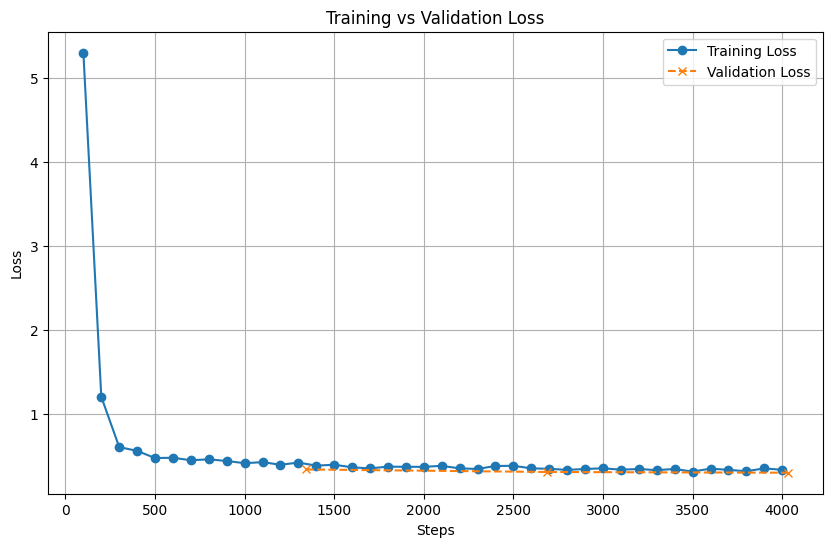

In [26]:
# Load TensorBoard log directory 
log_path = "train_logs/"  

# Initialize and load the event file
event_acc = EventAccumulator(log_path)
event_acc.Reload()

# Print available scalar tags
print("Available scalar tags:", event_acc.Tags()["scalars"])

train_loss_events = event_acc.Scalars("train/loss")
eval_loss_events = event_acc.Scalars("eval/loss")

# Extract steps and values
train_steps = [e.step for e in train_loss_events]
train_losses = [e.value for e in train_loss_events]

eval_steps = [e.step for e in eval_loss_events]
eval_losses = [e.value for e in eval_loss_events]

# Plot the losses
plt.figure(figsize=(10, 6))
plt.plot(train_steps, train_losses, label="Training Loss", marker='o')
plt.plot(eval_steps, eval_losses, label="Validation Loss", linestyle='--', marker='x')
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.show()